<a href="https://colab.research.google.com/github/juli-ter/Coursework4/blob/main/Mini_favorita.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import pandas as pd
# iter_csv = pd.read_csv(raw_path+'train_big.csv', iterator=True, skiprows=range(1, 16322660), chunksize=100000, dtype = dtype_dict, header=0, nrows=45000000)
# df = pd.concat([chunk[chunk['onpromotion'] == chunk['onpromotion'] ] for chunk in iter_csv])

In [ ]:
# df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
5334992,21657651,2014-04-01,1,103520,1.0,False
5334993,21657652,2014-04-01,1,103665,3.0,False
5334994,21657653,2014-04-01,1,105574,1.0,False
5334995,21657654,2014-04-01,1,105575,11.0,False
5334996,21657655,2014-04-01,1,105577,4.0,False
...,...,...,...,...,...,...
44999995,61322654,2015-11-06,19,463901,5.0,False
44999996,61322655,2015-11-06,19,463903,1.0,False
44999997,61322656,2015-11-06,19,464263,3.0,False
44999998,61322657,2015-11-06,19,464302,3.0,False


In [ ]:
# df.loc[df['onpromotion'] == df['onpromotion']]

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
21657651,21657651,2014-04-01,1,103520,1.0,False
21657652,21657652,2014-04-01,1,103665,3.0,False
21657653,21657653,2014-04-01,1,105574,1.0,False
21657654,21657654,2014-04-01,1,105575,11.0,False
21657655,21657655,2014-04-01,1,105577,4.0,False
...,...,...,...,...,...,...
26321995,26321995,2014-07-02,18,513853,1.0,False
26321996,26321996,2014-07-02,18,514149,1.0,False
26321997,26321997,2014-07-02,18,514172,1.0,False
26321998,26321998,2014-07-02,18,514444,2.0,False


##Strart


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import statsmodels.api as sm
import plotly.express as px
import datetime as dt
import warnings
import random

warnings.simplefilter('ignore')

In [3]:
raw_path = '/content/drive/MyDrive/Marketing/data/'
dtype_dict={"id":np.uint32,
            "store_nbr":np.uint8,
            "item_nbr":np.uint32,
            "unit_sales":np.float32
           }

In [4]:
p = 0.05  # 1% of the lines
# keep the header, then take only 1% of lines
# if random from [0,1] interval is greater than 0.01 the row will be skipped
train_df = pd.read_csv(
         raw_path + 'train_big.csv',
         dtype = dtype_dict,
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p
)


In [5]:
train_df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,6,2013-01-01,25,108797,1.0,NaN
1,17,2013-01-01,25,115892,10.0,NaN
2,28,2013-01-01,25,153395,7.0,NaN
3,158,2013-01-01,25,368624,1.0,NaN
4,162,2013-01-01,25,371437,1.0,NaN
...,...,...,...,...,...,...
6273151,125496940,2017-08-15,54,2011220,1.0,False
6273152,125496962,2017-08-15,54,2026256,7.0,False
6273153,125496987,2017-08-15,54,2047211,2.0,True
6273154,125496991,2017-08-15,54,2048141,1.0,False


In [6]:
train_df['date'] = pd.to_datetime(train_df['date'],format="%Y-%m-%d", errors='raise')
train_df = train_df[train_df.date.dt.year != 2013]

In [7]:
train_df.to_csv(raw_path + "train_df.csv", index=False)


In [ ]:
train_df = pd.read_csv(raw_path + 'train_df.csv', dtype = dtype_dict, index_col=False)

In [8]:
train_df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
814968,16322669,2014-01-01,25,108862,1.0,NaN
814969,16322690,2014-01-01,25,127547,6.0,NaN
814970,16322753,2014-01-01,25,253103,5.0,NaN
814971,16322780,2014-01-01,25,278806,7.0,NaN
814972,16322784,2014-01-01,25,302952,5.0,NaN
...,...,...,...,...,...,...
6273151,125496940,2017-08-15,54,2011220,1.0,False
6273152,125496962,2017-08-15,54,2026256,7.0,False
6273153,125496987,2017-08-15,54,2047211,2.0,True
6273154,125496991,2017-08-15,54,2048141,1.0,False


In [9]:
holidays = pd.read_csv(raw_path + 'holidays_events.csv', index_col=False,parse_dates=['date'], infer_datetime_format= True)
oil = pd.read_csv(raw_path + 'oil.csv', index_col=False, parse_dates=['date'], infer_datetime_format= True)
stores = pd.read_csv(raw_path + 'stores.csv', index_col=False)
items = pd.read_csv(raw_path + 'items.csv', index_col=False)

In [10]:
transactions = pd.read_csv(raw_path + 'transactions.csv', index_col=False)
# test = pd.read_csv(raw_path + 'test.csv', index_col=False,parse_dates=['date'], dtype={'store_nbr':'int8', 'family':'category','onpromotion':'int16','id':'int32'},
                #  infer_datetime_format= True)
# test = test.drop(columns=['id'])

In [11]:
train_df['date'] = pd.to_datetime(train_df.date)
# test['date'] = pd.to_datetime(test.date)
transactions['date'] = pd.to_datetime(transactions.date)

In [12]:
train_df.onpromotion = train_df.onpromotion.astype("float16")
# train.sales = train.sales.astype("float32")
stores.cluster = stores.cluster.astype("int8")

In [13]:
train_df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
814968,16322669,2014-01-01,25,108862,1.0,NaN
814969,16322690,2014-01-01,25,127547,6.0,NaN
814970,16322753,2014-01-01,25,253103,5.0,NaN
814971,16322780,2014-01-01,25,278806,7.0,NaN
814972,16322784,2014-01-01,25,302952,5.0,NaN
...,...,...,...,...,...,...
6273151,125496940,2017-08-15,54,2011220,1.0,0.0
6273152,125496962,2017-08-15,54,2026256,7.0,0.0
6273153,125496987,2017-08-15,54,2047211,2.0,1.0
6273154,125496991,2017-08-15,54,2048141,1.0,0.0


In [14]:
train_df.dropna(axis = 0, inplace = True)


In [15]:
train_df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
1081955,21657671,2014-04-01,1,115611,46.0,0.0
1081956,21657672,2014-04-01,1,115693,2.0,0.0
1081957,21657688,2014-04-01,1,122419,2.0,0.0
1081958,21657690,2014-04-01,1,123602,1.0,0.0
1081959,21657743,2014-04-01,1,207857,2.0,0.0
...,...,...,...,...,...,...
6273151,125496940,2017-08-15,54,2011220,1.0,0.0
6273152,125496962,2017-08-15,54,2026256,7.0,0.0
6273153,125496987,2017-08-15,54,2047211,2.0,1.0
6273154,125496991,2017-08-15,54,2048141,1.0,0.0


In [16]:
w_stores = train_df.merge(stores, on='store_nbr', how='inner')
train_full = w_stores.merge(items, on='item_nbr', how='inner')
train_full

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable
0,21657671,2014-04-01,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0
1,23349772,2014-05-05,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0
2,24087515,2014-05-20,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0
3,26570846,2014-07-06,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0
4,29022175,2014-08-14,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5191196,41547484,2015-02-20,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1
5191197,93890355,2016-10-14,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1
5191198,100163926,2016-12-16,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1
5191199,102944669,2017-01-13,51,1239986,4147.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1


In [17]:
len(train_full["cluster"].unique())

17

In [18]:
train_full.describe()

,id,store_nbr,item_nbr,unit_sales,onpromotion,cluster,class,perishable
count,5.191201e+06,5.191201e+06,5.191201e+06,5.191201e+06,5191201.0,5.191201e+06,5.191201e+06,5.191201e+06
mean,7.356713e+07,2.760418e+01,1.028261e+06,8.481016e+00,NaN,8.715532e+00,1.974183e+03,2.569120e-01
std,2.997008e+07,1.630748e+01,5.308116e+05,2.217999e+01,0.0,4.606934e+00,1.167543e+03,4.369305e-01
min,2.165767e+07,1.000000e+00,9.699500e+04,-1.790000e+02,0.0,1.000000e+00,1.002000e+03,0.000000e+00
25%,4.760933e+07,1.200000e+01,5.756750e+05,2.000000e+00,0.0,5.000000e+00,1.058000e+03,0.000000e+00
50%,7.356617e+07,2.800000e+01,1.047790e+06,4.000000e+00,0.0,9.000000e+00,1.190000e+03,0.000000e+00
75%,9.951319e+07,4.300000e+01,1.457000e+06,9.000000e+00,0.0,1.300000e+01,2.712000e+03,1.000000e+00
max,1.254970e+08,5.400000e+01,2.127114e+06,1.068500e+04,1.0,1.700000e+01,7.780000e+03,1.000000e+00


### visualisations

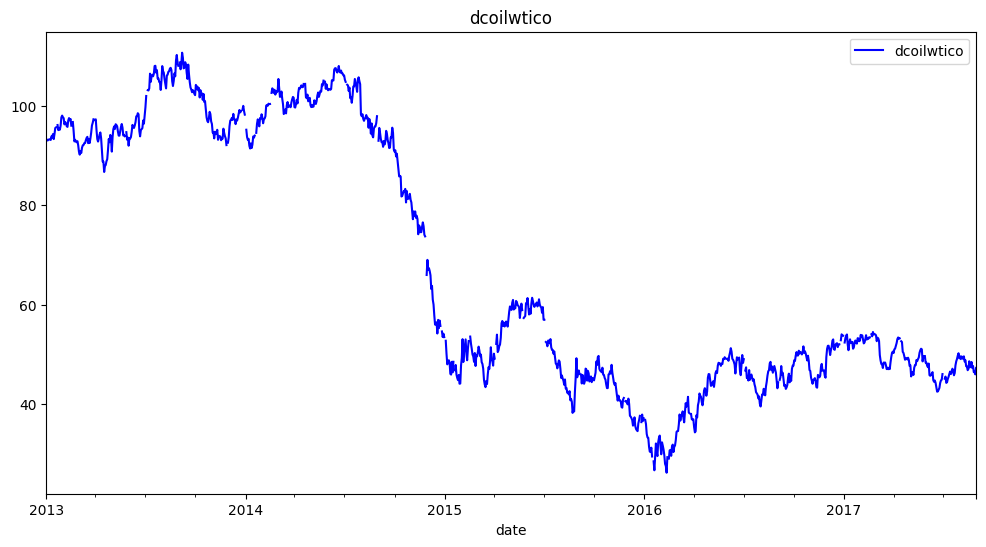

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12,6))
oil.plot.line(x="date", y="dcoilwtico", color='b', title ="dcoilwtico", ax = axes, rot=0)
plt.show()

In [ ]:
def grouped(df, key, freq, col):
    """ GROUP DATA WITH CERTAIN FREQUENCY """
    df_grouped = df.groupby([pd.Grouper(key=key, freq=freq)]).agg(mean = (col, 'mean'))
    df_grouped = df_grouped.reset_index()
    return df_grouped

df_grouped_trans_w = grouped(transactions, 'date', 'W', 'transactions')
df_grouped_trans_w

,date,mean
0,2013-01-06,1883.203463
1,2013-01-13,1641.090062
2,2013-01-20,1639.024845
3,2013-01-27,1609.816770
4,2013-02-03,1685.263975
...,...,...
237,2017-07-23,1623.208995
238,2017-07-30,1619.653439
239,2017-08-06,1713.743386
240,2017-08-13,1599.156085


In [ ]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [ ]:
oil['avg_oil'] = oil['dcoilwtico'].rolling(7).mean()
oil
# calendar = train_full.join(oil.avg_oil)

,date,dcoilwtico,avg_oil
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,NaN
2,2013-01-03,92.97,NaN
3,2013-01-04,93.12,NaN
4,2013-01-07,93.20,NaN
...,...,...,...
1213,2017-08-25,47.65,47.720000
1214,2017-08-28,46.40,47.624286
1215,2017-08-29,46.46,47.320000
1216,2017-08-30,45.96,47.115714


Correlation between oil and sales and transaction suggests that the country's economic status and everyday grocery consumption do not have a particular relationship

In [19]:
train_full = train_full.merge(oil, on ='date', how='left')
train_full

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico
0,21657671,2014-04-01,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69
1,23349772,2014-05-05,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74
2,24087515,2014-05-20,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80
3,26570846,2014-07-06,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,NaN
4,29022175,2014-08-14,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5191196,41547484,2015-02-20,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95
5191197,93890355,2016-10-14,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35
5191198,100163926,2016-12-16,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93
5191199,102944669,2017-01-13,51,1239986,4147.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,52.36


In [20]:
"""I will get rid holidays that were transferred
and holidays that are announced a Work day, in addition to dates that are duplicated.
"""   
holidays_events= holidays.loc[(holidays.transferred==False) & (holidays.type != 'Work Day')]
holidays_events=holidays_events.drop_duplicates(subset='date')  ## Drop duplicated dates
holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
344,2017-12-22,Holiday,Local,Salinas,Cantonizacion de Salinas,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [21]:
def seasonal_plot(X, y, period, freq):
    """
    This defination is to plot seasonal fluctuation in a time series to discover seasonal patterns.
    Inputs:
            X: time series.
            y: target variables 
            period: The period of time series
            freq: The frequency to plot time seris for it
    Output:
        Time Series Seasonal Plot    
    """
    _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(x=freq, y=y, hue=period, data=X, ci=False, ax=ax,
                      palette=palette, legend=False)
    
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(name, xy=(1, y_), xytext=(6, 0), color=line.get_color(),size=14,
                    xycoords=ax.get_yaxis_transform(), textcoords="offset points",va="center")
        
    return ax


def plot_periodogram(ts):
    """
    This defination is to discover seasonality and plot the periodogram for a time series. 
    """
    
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(ts, fs=fs, detrend='linear', window="boxcar",scaling='spectrum')
    
    _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        ["Annual (1)", "Semiannual (2)", "Quarterly (4)", "Bimonthly (6)", "Monthly (12)",
         "Biweekly (26)", "Weekly (52)", "Semiweekly (104)"], rotation=30)
    
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    
    return ax

<Axes: title={'center': 'Seasonal Plot (year/dayofyear)'}, xlabel='dayofyear', ylabel='unit_sales'>

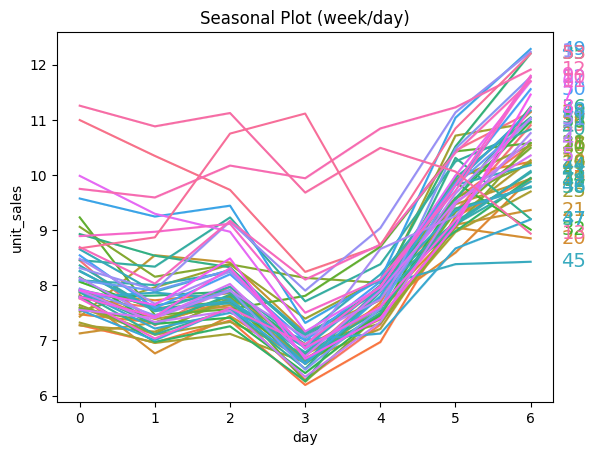

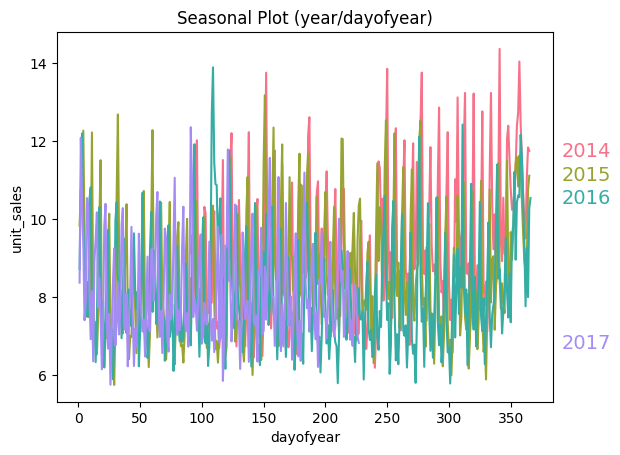

In [22]:
avg_sales = train_full.groupby('date')['unit_sales'].mean().to_frame()

# days within a week
avg_sales["day"] = avg_sales.index.dayofweek  # the x-axis (freq)
avg_sales["week"] = avg_sales.index.week  # the seasonal period (period)

# days within a year
avg_sales["dayofyear"] = avg_sales.index.dayofyear
avg_sales["year"] = avg_sales.index.year

seasonal_plot(avg_sales, y=avg_sales['unit_sales'], period="week", freq="day")
seasonal_plot(avg_sales, y=avg_sales['unit_sales'], period="year", freq="dayofyear")

#### add holidays

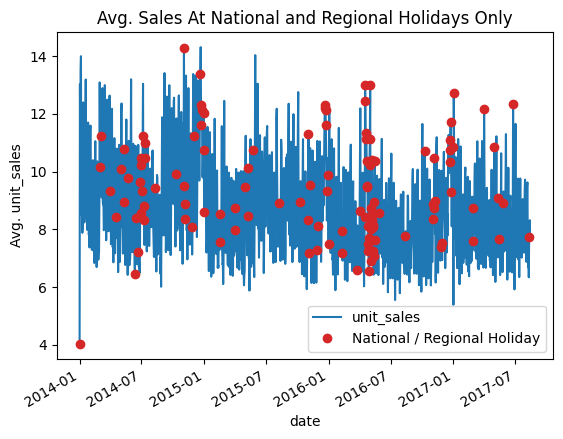

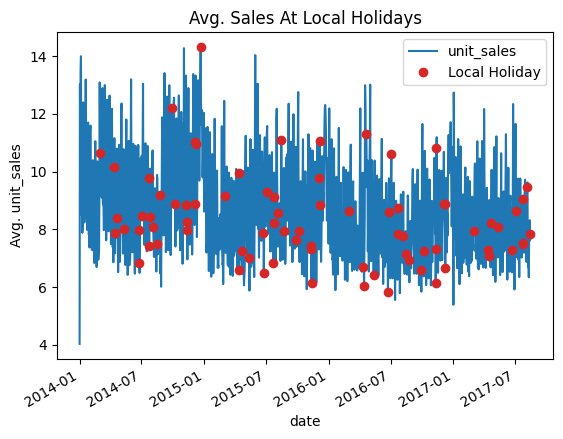

In [ ]:
## National and Regional Holidays Only

NRHolidays=holidays_events.loc[holidays_events['locale']!='Local',:]
NRHolidays_avg_sales=avg_sales.reset_index().merge(NRHolidays,on='date',how='left')
x_cor=NRHolidays_avg_sales.loc[NRHolidays_avg_sales['type'].notna(),'date'].values
y_cor=NRHolidays_avg_sales.loc[NRHolidays_avg_sales['type'].notna(),'unit_sales'].values
_=avg_sales['unit_sales'].plot()
_=plt.plot_date(x_cor,y_cor,color='C3', label='National / Regional Holiday')
_=plt.ylabel('Avg. unit_sales')
_=plt.title('Avg. Sales At National and Regional Holidays Only')
_=plt.legend()

plt.show()

## LocalHolidays Only
LHolidays=holidays_events.loc[holidays_events['locale']=='Local',:]
LHolidays_avg_sales=avg_sales.reset_index().merge(LHolidays,on='date',how='left')
x_cor=LHolidays_avg_sales.loc[LHolidays_avg_sales['type'].notna(),'date'].values
y_cor=LHolidays_avg_sales.loc[LHolidays_avg_sales['type'].notna(),'unit_sales'].values
_=avg_sales['unit_sales'].plot()
_=plt.plot_date(x_cor,y_cor,color='C3', label='Local Holiday')
_=plt.ylabel('Avg. unit_sales')
_=plt.title('Avg. Sales At Local Holidays')
_=plt.legend()

plt.show()

Indeed, there is a differance between those three holiday types, Sales at Local holidays has no significant impact than another normal days, while sales at National/ Regional holidays are more significant for sales versus another days.

I will get rid Local holidays.

I will merge "train" & "holidays_events" datasets togather, creat new holiday indicator column at the new merged dataset that take two values:

0 for workdays.
1 for holiday, event, bridge, additional, weekend days.

In [23]:
holidays_events= holidays_events[holidays_events.locale!='Local']

In [24]:
holidays_events.rename({'type':'is_holiday'},axis=1,inplace=True)

In [25]:
holidays_events

,date,is_holiday,locale,locale_name,description,transferred
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False
21,2012-11-02,Holiday,National,Ecuador,Dia de Difuntos,False
...,...,...,...,...,...,...
343,2017-12-21,Additional,National,Ecuador,Navidad-4,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [26]:
train_full.head()

,id,date,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico
0,21657671,2014-04-01,1,115611,46.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69
1,23349772,2014-05-05,1,115611,13.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74
2,24087515,2014-05-20,1,115611,9.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80
3,26570846,2014-07-06,1,115611,7.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,NaN
4,29022175,2014-08-14,1,115611,7.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54


In [27]:
holidays_events = holidays_events[['date','is_holiday']] ## Keep date & holiday type for merging
train_eda = pd.merge(left=train_full, right=holidays_events, on='date', how='left')
train_eda['is_holiday'] = train_eda.is_holiday.map({'Holiday':1,'Additional':1,'Event':1,
                                                  'Bridge':1,'Transfer':1}).fillna(0).astype('int8')

# ## Adding weekends to holiday as well
train_eda.set_index('date',inplace=True)
train_eda['day_of_week']=train_eda.index.dayofweek.astype('int8')
train_eda.loc[(train_eda['day_of_week']==5) | (train_eda['day_of_week']==6), 'is_holiday']=1

# ## Removing he first day of a year from holidays as mentioned before Favorita is closed these days.
train_eda['day_of_year']=train_eda.index.dayofyear.astype('int16')
train_eda.loc[train_eda['day_of_year']==1 ,'is_holiday']=0
train_eda['year'] = train_eda.index.year
train_eda['month'] = train_eda.index.month
train_eda['day'] = train_eda.index.day


train_eda


,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day
date,,,,,,,,,,,,,,,,,,,
2014-04-01,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1
2014-05-05,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5
2014-05-20,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20
2014-07-06,26570846,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,NaN,1,6,187,2014,7,6
2014-08-14,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95,0,4,51,2015,2,20
2016-10-14,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35,0,4,288,2016,10,14
2016-12-16,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93,0,4,351,2016,12,16


In [28]:
train_eda.dropna(axis = 0, inplace = True)


In [29]:
train_eda

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day
date,,,,,,,,,,,,,,,,,,,
2014-04-01,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1
2014-05-05,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5
2014-05-20,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20
2014-08-14,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14
2014-12-03,36515701,1,115611,10.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,67.30,0,2,337,2014,12,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95,0,4,51,2015,2,20
2016-10-14,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35,0,4,288,2016,10,14
2016-12-16,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93,0,4,351,2016,12,16


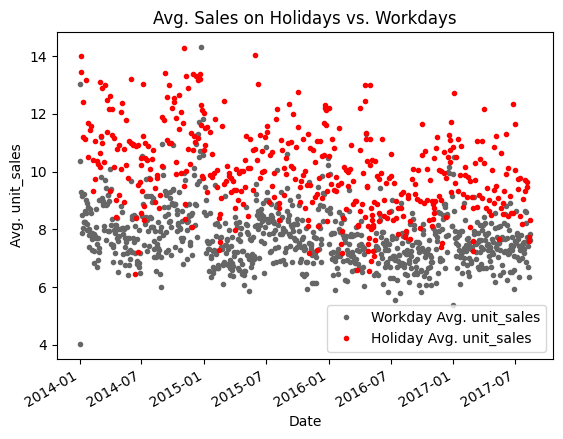

In [ ]:
avg_sales_holiday=train_eda[train_eda.is_holiday==1].groupby('date')['unit_sales'].mean() ## Grouping by holidays
avg_sales_workday=train_eda[train_eda.is_holiday==0].groupby('date')['unit_sales'].mean() ## Grouping by workdays

_=avg_sales_workday.plot(color='0.4',style='.', legend=True, label='Workday Avg. unit_sales')
_=avg_sales_holiday.plot(color='red',style='.', legend=True, label='Holiday Avg. unit_sales')
plt.xlabel('Date')
plt.ylabel('Avg. unit_sales')
plt.title('Avg. Sales on Holidays vs. Workdays')

plt.show()

We succeed to prove the trading theory, from above chart we can obviously see the high difference between sales on holidays versus workdays. Except the zero sales at the first day of the years, and that is as mentioned before due to Favorita supermarkets chain was closed.

Holiday indicator will be used as a variable for training.

In [30]:

train_eda

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day
date,,,,,,,,,,,,,,,,,,,
2014-04-01,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1
2014-05-05,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5
2014-05-20,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20
2014-08-14,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14
2014-12-03,36515701,1,115611,10.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,67.30,0,2,337,2014,12,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95,0,4,51,2015,2,20
2016-10-14,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35,0,4,288,2016,10,14
2016-12-16,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93,0,4,351,2016,12,16


In [31]:
train_eda.to_csv(raw_path + "train_eda.csv", index=False)
# train_eda = pd.read_csv(raw_path + 'train_eda.csv', dtype = dtype_dict, index_col=False)

#### top 10s


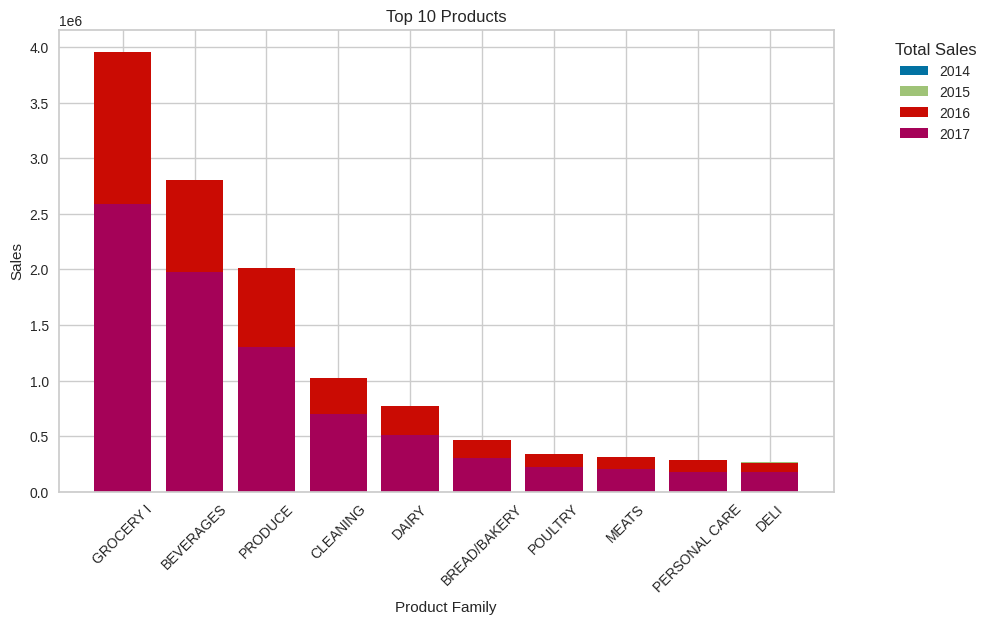

In [ ]:
train = train_full.copy()
train["date"] = pd.to_datetime(train["date"])
train["year"] = train["date"].dt.year

# group the data by year and product family and sum up the sales
sales_by_year_and_product = train.groupby(["year", "family"])["unit_sales"].sum().reset_index()

# sort the data by year and sales in descending order
sales_by_year_and_product = sales_by_year_and_product.sort_values(by=["year", "unit_sales"], ascending=[True, False])
fig, ax = plt.subplots(figsize=(10, 6))

# loop over the years and plot the top 10 products for each year
for year in sales_by_year_and_product["year"].unique():
    top_products = sales_by_year_and_product[sales_by_year_and_product["year"] == year].head(10)
    ax.bar(top_products["family"], top_products["unit_sales"], label=str(year))

# set the axis labels and legend
ax.set_xlabel("Product Family")
ax.set_ylabel("Sales")
ax.legend(title="Total Sales", loc="upper right", bbox_to_anchor=(1.2, 1))

# rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# set the title and show the plot
ax.set_title("Top 10 Products")
plt.show()

In [ ]:
train_full.fillna('', inplace=True)

In [ ]:
df_category_sales = train_full.groupby('family').unit_sales.sum().reset_index()
df_category_sales = df_category_sales.sort_values('unit_sales', ascending=False)
sh = df_category_sales[:10]
sh

,family,unit_sales
12,GROCERY I,1.288664e+07
3,BEVERAGES,8.765648e+06
30,PRODUCE,5.498117e+06
7,CLEANING,3.599347e+06
8,DAIRY,2.564015e+06
5,BREAD/BAKERY,1.578562e+06
28,POULTRY,1.240597e+06
24,MEATS,1.094681e+06
25,PERSONAL CARE,9.367030e+05
9,DELI,9.052331e+05


Text(0, 0.5, 'Sales')

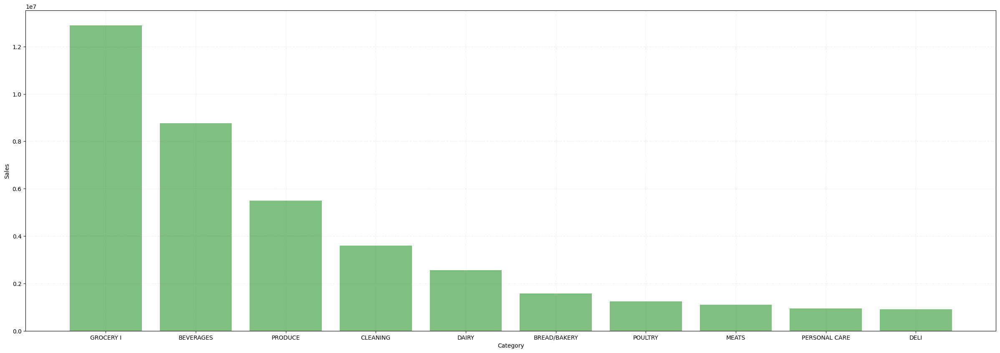

In [ ]:
plt.figure(figsize=[30, 10]) #, dpi = 500
plt.grid(visible = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)

plt.bar(sh['family'], sh['unit_sales'], color = 'green', alpha=0.5) 

plt.xlabel('Category')
plt.ylabel('Sales')

In [ ]:
df_onprom_sales = train_full.groupby('onpromotion').unit_sales.sum().reset_index()
df_onprom_sales

,onpromotion,unit_sales
0,0.0,34992044.0
1,1.0,4729477.0


The correlation between sales & onpromotion is:  0.4419 



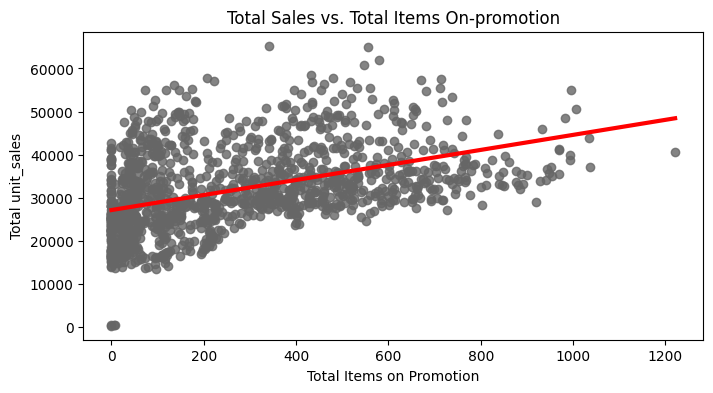

In [ ]:
avg_sales=train_full.groupby(['date'])['unit_sales','onpromotion'].sum().reset_index() 

print('The correlation between sales & onpromotion is: ',
      np.round(avg_sales[['unit_sales','onpromotion']].corr().iloc[0,1],4),'\n')

plt.figure(figsize=(8,4))
sns.regplot(data=avg_sales,x='onpromotion',y='unit_sales',ci=None,
            scatter_kws={'color':'0.4'},line_kws={'color':'red','linewidth':3})
plt.xlabel('Total Items on Promotion')
plt.ylabel('Total unit_sales')
plt.title('Total Sales vs. Total Items On-promotion')
plt.show()

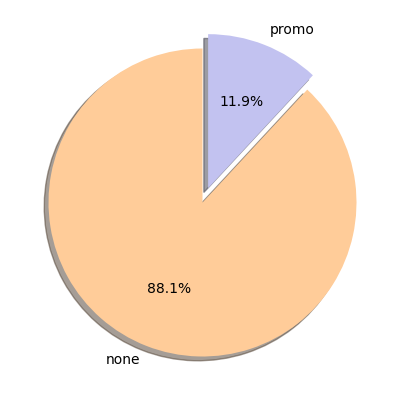

In [ ]:
labels = train_full.replace([False, True], ['No promotion', 'On promotion'])['onpromotion'].unique()
colors = ['#ffcc99', '#c2c2f0']
explode = (0, 0.1)   

fig1, ax1 = plt.subplots(figsize = [5, 5])
ax1.pie(df_onprom_sales['unit_sales'], explode=explode, labels=['none','promo'], autopct='%1.1f%%', colors = colors,
        shadow=True, startangle=90)
plt.show()

In [ ]:
df_perishable_sales = train_full.groupby('perishable').unit_sales.sum().reset_index()
df_perishable_sales

,perishable,unit_sales
0,0,28159946.0
1,1,13854374.0


Text(0, 0.5, 'Sales')

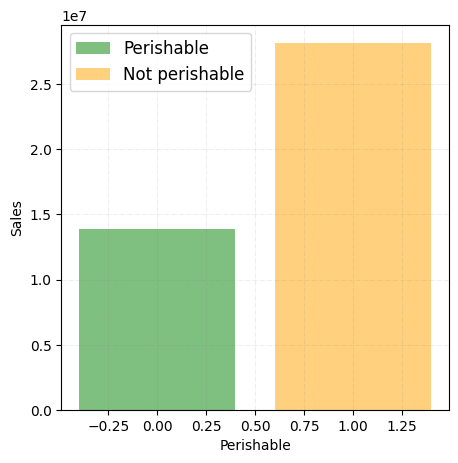

In [ ]:
plt.figure(figsize=[5, 5]) #, dpi = 500
plt.grid(visible = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.2)

plt.bar(0, df_perishable_sales[df_perishable_sales.perishable == 1]['unit_sales'], color = 'green', alpha=0.5, label='Perishable' ) 
plt.bar(1, df_perishable_sales[df_perishable_sales.perishable == 0]['unit_sales'], color = 'orange', alpha=0.5, label = 'Not perishable')

plt.legend(fontsize = 12)
plt.xlabel('Perishable')
plt.ylabel('Sales')

In [ ]:
df_store_sales = train_full.groupby('type').unit_sales.sum().reset_index()
df_store_sales
     

,type,unit_sales
0,A,13769667.0
1,B,5670734.0
2,C,6350945.0
3,D,13779531.0
4,E,2443442.5


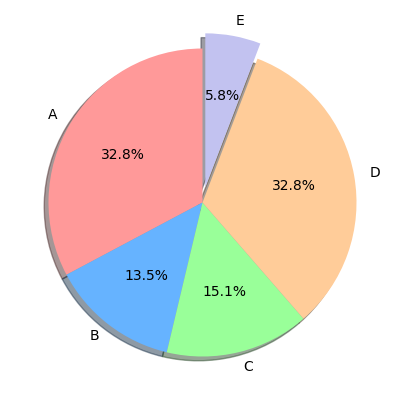

In [ ]:
explode = (0, 0, 0, 0, 0.1)  
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99', '#c2c2f0']

fig1, ax1 = plt.subplots(figsize = [5, 5])
ax1.pie(df_store_sales['unit_sales'], explode=explode, labels = ['A', 'B', 'C', 'D', 'E'], autopct='%1.1f%%', colors = colors,
        shadow=True, startangle=90)
plt.show()

In [ ]:
x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars
lst = list(sh['family'].unique())

fig, ax = plt.subplots(figsize = [30, 15], dpi = 500)

rects2 = ax.bar(x - width/2, [train_full[(train_full['family'] == i) & (train_full['onpromotion'] == 0)].unit_sales.sum() for i in lst], color = 'salmon', width=width, label='Without promotion')
rects4 = ax.bar(x + width/2, [train_full[(train_full['family'] == i) & (train_full['onpromotion'] == 1)].unit_sales.sum() for i in lst], color = 'cornflowerblue', width=width, label='With promotion')


ax.set_xticks(x, labels) 
ax.tick_params(axis='both', which='major')
ax.legend(fontsize = 50)

fig.tight_layout()

#### GEO

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 51.4 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
geo = gpd.read_file(raw_path+ 'cantons.geojson')


In [ ]:
geo


,canton,province,iso_2,iso_1,geometry
0,Cuenca,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,Giron,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,GUALACEO,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,NABON,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,PAUTE,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."
...,...,...,...,...,...
219,LA LIBERTAD,Santa Elena,EC-SE,EC,"MULTIPOLYGON (((-80.87062 -2.27018, -80.87315 ..."
220,SALINAS,Santa Elena,EC-SE,EC,"MULTIPOLYGON (((-80.92200 -2.21943, -80.92059 ..."
221,LAS GOLONDRINAS,ZONA NO DELIMITADA,90,EC,"MULTIPOLYGON (((-78.92286 0.35833, -78.92784 0..."
222,MANGA DEL CURA,ZONA NO DELIMITADA,90,EC,"MULTIPOLYGON (((-79.45992 -0.50373, -79.45941 ..."


In [ ]:
stores


,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [ ]:
stores['state'] = stores['state'].str.upper()
geo['canton'] = geo['canton'].str.upper()

stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,PICHINCHA,D,13
1,2,Quito,PICHINCHA,D,13
2,3,Quito,PICHINCHA,D,8
3,4,Quito,PICHINCHA,D,9
4,5,Santo Domingo,SANTO DOMINGO DE LOS TSACHILAS,D,4


In [ ]:

data = pd.concat([stores, geo], axis=1, join='inner')
display(data) 

,store_nbr,city,state,type,cluster,canton,province,iso_2,iso_1,geometry
0,1,Quito,PICHINCHA,D,13,CUENCA,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ..."
1,2,Quito,PICHINCHA,D,13,GIRON,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ..."
2,3,Quito,PICHINCHA,D,8,GUALACEO,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ..."
3,4,Quito,PICHINCHA,D,9,NABON,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ..."
4,5,Santo Domingo,SANTO DOMINGO DE LOS TSACHILAS,D,4,PAUTE,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ..."
5,6,Quito,PICHINCHA,D,13,PUCARA,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.47671 -3.04682, -79.46256 ..."
6,7,Quito,PICHINCHA,D,8,SAN FERNANDO,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.23552 -3.06262, -79.23240 ..."
7,8,Quito,PICHINCHA,D,8,SANTA ISABEL,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.30373 -3.06660, -79.30437 ..."
8,9,Quito,PICHINCHA,B,6,SIGSIG,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.77366 -2.98373, -78.77243 ..."
9,10,Quito,PICHINCHA,C,15,OÑA,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.05200 -3.46120, -79.04447 ..."


In [ ]:
import warnings
warnings.filterwarnings('ignore')
geo['stores'] = 0
for i in range(len(geo)):
    geo['stores'].iloc[i] = len(stores[stores.state == geo.canton.iloc[i]])

In [ ]:
geo

,canton,province,iso_2,iso_1,geometry,stores
0,CUENCA,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.39303 -2.49798, -79.39052 ...",0
1,GIRON,Azuay,EC-A,EC,"MULTIPOLYGON (((-79.02892 -3.17588, -79.02701 ...",0
2,GUALACEO,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.63193 -2.93822, -78.63687 ...",0
3,NABON,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.93581 -3.28822, -78.93412 ...",0
4,PAUTE,Azuay,EC-A,EC,"MULTIPOLYGON (((-78.64190 -2.72233, -78.64778 ...",0
...,...,...,...,...,...,...
219,LA LIBERTAD,Santa Elena,EC-SE,EC,"MULTIPOLYGON (((-80.87062 -2.27018, -80.87315 ...",0
220,SALINAS,Santa Elena,EC-SE,EC,"MULTIPOLYGON (((-80.92200 -2.21943, -80.92059 ...",0
221,LAS GOLONDRINAS,ZONA NO DELIMITADA,90,EC,"MULTIPOLYGON (((-78.92286 0.35833, -78.92784 0...",0
222,MANGA DEL CURA,ZONA NO DELIMITADA,90,EC,"MULTIPOLYGON (((-79.45992 -0.50373, -79.45941 ...",0


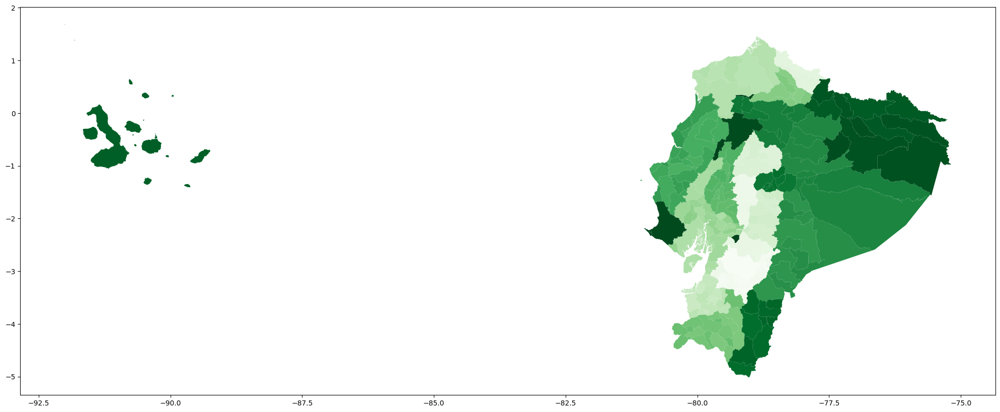

In [ ]:
geo[['geometry', 'stores']].plot(cmap = 'Greens', figsize=[25, 15]);


###other analysis

#### stores

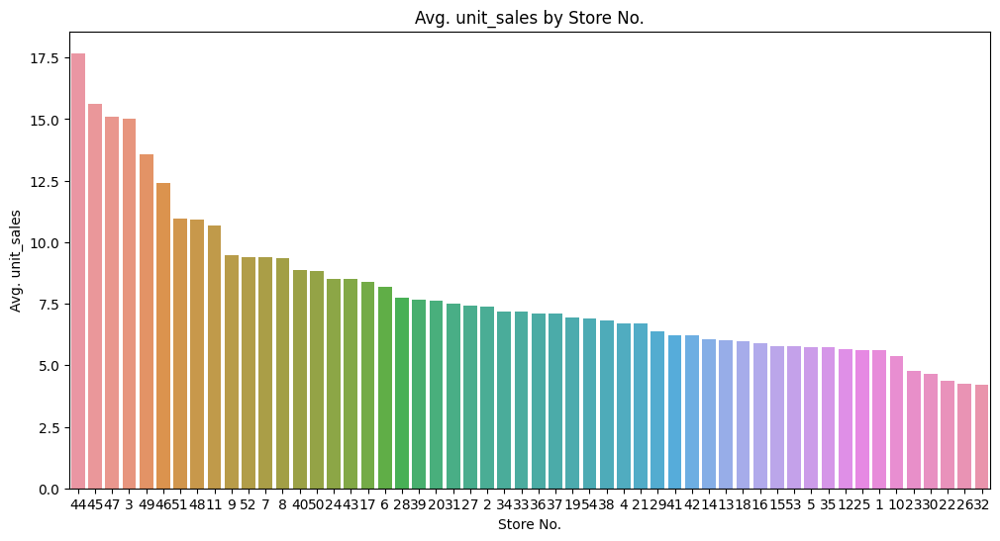

The best stores No. sell are:  [44, 45, 47, 3, 49]

The worst stores No. sell are:  [23, 30, 22, 26, 32]


In [ ]:
temp=train_full.groupby('store_nbr')['unit_sales'].mean().sort_values(ascending=False).to_frame()

plt.figure(figsize=(12,6))
sns.barplot(data=temp,x=temp.index,y=temp.unit_sales,ci=None,order=list(temp.index))
plt.xlabel('Store No.')
plt.ylabel('Avg. unit_sales')
plt.title('Avg. unit_sales by Store No.')
plt.show()

print('The best stores No. sell are: ',list(temp.index[:5]))
print('\nThe worst stores No. sell are: ',list(temp.index[-5:]))

In [ ]:
# import pandas as pd
# import seaborn as sns
# import plotly.express as px
# df = pd.read_csv('dataset.csv')
# crm = df.corr()
# fig = px.imshow(crm, color_continuous_scale = 'algae')
# fig.update_layout(paper_bgcolor="rgb(0,0,0,0)", font_color = "rgb(1, 1, 1)")
# fig.show()

#### transactions


In [ ]:
transactions_fig = px.line(transactions.sort_values(['store_nbr','date']),x='date',y='transactions',color='store_nbr',title ='Transactions')
transactions_fig.show()

In [ ]:
trans_copy = transactions.copy()
trans_copy['year'] = trans_copy.date.dt.year
trans_copy['month'] = trans_copy.date.dt.month
trans_copy['week'] = trans_copy.date.dt.dayofweek

box_plot_trans = px.box(trans_copy, x='year',y='transactions',color='month',title='transactions')
box_plot_trans.show()

A lot of sales in the year end

In [ ]:
box_data = transactions.set_index('date').resample('M').transactions.mean().reset_index()
box_data['year'] = box_data.date.dt.year 
monthly_trans = px.line(box_data,x='date',y='transactions',color='year',title='Monthly average transactions')
monthly_trans.show()

In [ ]:
Transactions_vs_sales = px.scatter(trans_merge,x='transactions',y='sales',trendline ='ols',trendline_color_override = "green",title ='Transactions vs sales')
Transactions_vs_sales.show()

In [ ]:
week_group = trans_copy.groupby(['year','week']).transactions.mean().reset_index()
week_group_plot = px.line(week_group,x ='week',y='transactions',color ='year')
week_group_plot.show()

There are lot of transactions on saturday

In [ ]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
print(train.shape)

(3000888, 6)
(2780316, 6)


No sales for stores and families

In [ ]:
c = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.0
397,13,BABY CARE,0.0
727,23,BABY CARE,0.0
1420,44,BABY CARE,0.0
1453,45,BABY CARE,0.0
1486,46,BABY CARE,0.0
1519,47,BABY CARE,0.0
1552,48,BABY CARE,0.0
1585,49,BABY CARE,0.0
1618,50,BABY CARE,0.0


In [ ]:
print(train.shape)
# Anti Join
outer_join = train.merge(c[c.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join

train.shape

(2780316, 6)


(2698648, 6)

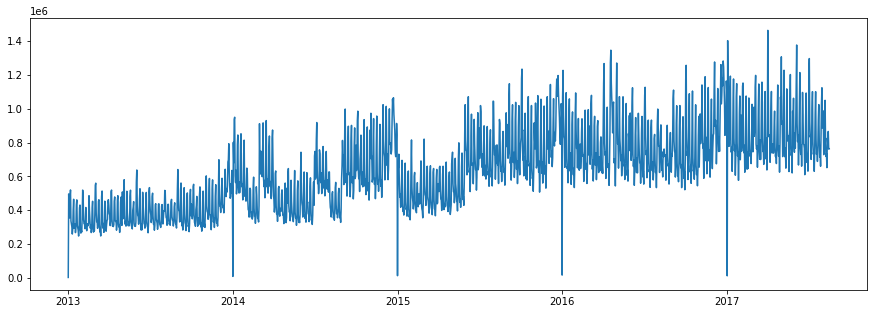

In [ ]:
sales_grouped = train.groupby(['date']).sum().reset_index()
plt.figure(figsize = (15,5))
plt.plot(sales_grouped.date,sales_grouped.sales)
plt.show()

### Clustering

In [35]:
train_eda = pd.read_csv(raw_path + 'train_eda.csv', dtype = dtype_dict, index_col=False)

In [36]:
train_eda.head()

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day
0,21657671,1,115611,46.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1
1,23349772,1,115611,13.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5
2,24087515,1,115611,9.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20
3,29022175,1,115611,7.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14
4,36515701,1,115611,10.0,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,67.30,0,2,337,2014,12,3


In [16]:
train_eda.drop(['id','day_of_week',	'day_of_year'], axis = 1, inplace = True)


In [33]:
len(train_eda["class"].unique())

331

In [20]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()
  
train_eda['city']= label_encoder.fit_transform(train_eda['city'])
train_eda['state']= label_encoder.fit_transform(train_eda['state'])
train_eda['type']= label_encoder.fit_transform(train_eda['type'])
train_eda['family']= label_encoder.fit_transform(train_eda['family'])


In [8]:
train_eda

,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,year,month,day
0,1,115611,46.000000,0.0,18,12,3,13,12,1014,0,99.69,1,2014,4,1
1,1,115611,13.000000,0.0,18,12,3,13,12,1014,0,99.74,0,2014,5,5
2,1,115611,9.000000,0.0,18,12,3,13,12,1014,0,102.80,0,2014,5,20
3,1,115611,7.000000,0.0,18,12,3,13,12,1014,0,95.54,0,2014,8,14
4,1,115611,10.000000,0.0,18,12,3,13,12,1014,0,67.30,0,2014,12,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513480,51,1239986,26.309999,1.0,8,6,0,17,28,2420,1,49.95,0,2015,2,20
3513481,51,1239986,2594.000000,1.0,8,6,0,17,28,2420,1,50.35,0,2016,10,14
3513482,51,1239986,2656.199951,1.0,8,6,0,17,28,2420,1,51.93,0,2016,12,16
3513483,51,1239986,4147.000000,1.0,8,6,0,17,28,2420,1,52.36,0,2017,1,13


In [17]:
object_cols = [cname for cname in train_eda.columns 
               if train_eda[cname].dtype == "object" 
               and cname != "date"]

print("Categorical variables:")
object_cols.extend(['store_nbr', 'onpromotion','perishable','is_holiday', 'cluster'])
object_cols

Categorical variables:


['city',
 'state',
 'type',
 'family',
 'store_nbr',
 'onpromotion',
 'perishable',
 'is_holiday',
 'cluster']

In [18]:
num_cols = [cname for cname in train_eda.columns 
            if train_eda[cname].dtype != "object" and cname not in object_cols]

print("Numerical variables:")
num_cols 

Numerical variables:


['item_nbr', 'unit_sales', 'class', 'dcoilwtico', 'year', 'month', 'day']

In [ ]:
train_eda.info()

In [37]:
train_eda = train_eda.dropna()

In [38]:
one_hot_encoded_data = pd.get_dummies(train_eda, columns = object_cols)
one_hot_encoded_data

,item_nbr,unit_sales,class,dcoilwtico,year,month,day,city_Ambato,city_Babahoyo,city_Cayambe,...,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12,cluster_13,cluster_14,cluster_15,cluster_16,cluster_17
date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,115611,46.000000,1014,99.69,2014,4,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-05,115611,13.000000,1014,99.74,2014,5,5,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-20,115611,9.000000,1014,102.80,2014,5,20,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-08-14,115611,7.000000,1014,95.54,2014,8,14,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-12-03,115611,10.000000,1014,67.30,2014,12,3,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,1239986,26.309999,2420,49.95,2015,2,20,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-10-14,1239986,2594.000000,2420,50.35,2016,10,14,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-12-16,1239986,2656.199951,2420,51.93,2016,12,16,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
for i in one_hot_encoded_data.columns:
    print("\""+ i + "\":np.uint8,")

"item_nbr":np.uint8,
"unit_sales":np.uint8,
"class":np.uint8,
"dcoilwtico":np.uint8,
"year":np.uint8,
"month":np.uint8,
"day":np.uint8,
"city_Ambato":np.uint8,
"city_Babahoyo":np.uint8,
"city_Cayambe":np.uint8,
"city_Cuenca":np.uint8,
"city_Daule":np.uint8,
"city_El Carmen":np.uint8,
"city_Esmeraldas":np.uint8,
"city_Guaranda":np.uint8,
"city_Guayaquil":np.uint8,
"city_Ibarra":np.uint8,
"city_Latacunga":np.uint8,
"city_Libertad":np.uint8,
"city_Loja":np.uint8,
"city_Machala":np.uint8,
"city_Manta":np.uint8,
"city_Playas":np.uint8,
"city_Puyo":np.uint8,
"city_Quevedo":np.uint8,
"city_Quito":np.uint8,
"city_Riobamba":np.uint8,
"city_Salinas":np.uint8,
"city_Santo Domingo":np.uint8,
"state_Azuay":np.uint8,
"state_Bolivar":np.uint8,
"state_Chimborazo":np.uint8,
"state_Cotopaxi":np.uint8,
"state_El Oro":np.uint8,
"state_Esmeraldas":np.uint8,
"state_Guayas":np.uint8,
"state_Imbabura":np.uint8,
"state_Loja":np.uint8,
"state_Los Rios":np.uint8,
"state_Manabi":np.uint8,
"state_Pastaza":np.uint8

In [19]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# encoded = scaler.fit_transform(one_hot_encoded_data[num_cols])



In [21]:
encoded = scaler.fit_transform(train_eda[num_cols])
train_eda[num_cols] = encoded


In [40]:
one_hot_encoded_data[num_cols] = encoded
one_hot_encoded_data

,item_nbr,unit_sales,class,dcoilwtico,year,month,day,city_Ambato,city_Babahoyo,city_Cayambe,...,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12,cluster_13,cluster_14,cluster_15,cluster_16,cluster_17
date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,-1.716991,1.754354,-0.825810,2.524936,-1.612943,-0.764549,-1.651868,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-05,-1.716991,0.238764,-0.825810,2.527677,-1.612943,-0.462563,-1.197523,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-20,-1.716991,0.055056,-0.825810,2.695463,-1.612943,-0.462563,0.506270,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-08-14,-1.716991,-0.036798,-0.825810,2.297384,-1.612943,0.443394,-0.175247,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-12-03,-1.716991,0.100983,-0.825810,0.748933,-1.612943,1.651336,-1.424695,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,0.402490,0.850052,0.394400,-0.202400,-0.620792,-1.368520,0.506270,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-10-14,0.402490,118.776314,0.394400,-0.180467,0.371359,1.047365,-0.175247,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-12-16,0.402490,121.632971,0.394400,-0.093833,0.371359,1.651336,0.051925,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [41]:
one_hot_encoded_data.to_csv(raw_path + "encoded.csv", index=False)


In [42]:
one_hot_encoded_data

,item_nbr,unit_sales,class,dcoilwtico,year,month,day,city_Ambato,city_Babahoyo,city_Cayambe,...,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12,cluster_13,cluster_14,cluster_15,cluster_16,cluster_17
date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,-1.716991,1.754354,-0.825810,2.524936,-1.612943,-0.764549,-1.651868,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-05,-1.716991,0.238764,-0.825810,2.527677,-1.612943,-0.462563,-1.197523,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-05-20,-1.716991,0.055056,-0.825810,2.695463,-1.612943,-0.462563,0.506270,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-08-14,-1.716991,-0.036798,-0.825810,2.297384,-1.612943,0.443394,-0.175247,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2014-12-03,-1.716991,0.100983,-0.825810,0.748933,-1.612943,1.651336,-1.424695,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-20,0.402490,0.850052,0.394400,-0.202400,-0.620792,-1.368520,0.506270,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-10-14,0.402490,118.776314,0.394400,-0.180467,0.371359,1.047365,-0.175247,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-12-16,0.402490,121.632971,0.394400,-0.093833,0.371359,1.651336,0.051925,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [10]:
%%capture
!pip install yellowbrick

In [ ]:
# dtype_dict={"id":np.uint32,
#             "store_nbr":np.uint8,
#             "item_nbr":np.uint32,
#             "unit_sales":np.float32
#            }

In [ ]:
df = pd.read_csv(raw_path + 'encoded.csv', dtype = dtype_dict, index_col=False)
df

In [ ]:
df = one_hot_encoded_data

In [ ]:
df 

,item_nbr,unit_sales,class,dcoilwtico,year,month,day,city_Ambato,city_Babahoyo,city_Cayambe,...,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12,cluster_13,cluster_14,cluster_15,cluster_16,cluster_17
0,-1.736463,-0.077259,-0.800175,2.524626,-1.613115,-0.764517,-1.651178,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,-1.736463,-0.161861,-0.800175,2.637000,-1.613115,-0.462529,-0.061200,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,-1.736463,-0.204161,-0.800175,2.724707,-1.613115,-0.160541,-1.424038,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,-1.736463,-0.204161,-0.800175,2.715388,-1.613115,-0.160541,-1.196898,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,-1.736463,-0.246462,-0.800175,2.828310,-1.613115,0.141447,1.074498,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3864325,0.402443,112.104467,0.394122,-0.165771,0.371057,1.047411,0.620219,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3864326,0.402443,79.448248,0.394122,-0.075872,1.363143,-0.764517,-0.969759,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3864327,0.402443,113.708510,0.394122,-0.318161,1.363143,-0.462529,-0.401910,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3864328,2.054644,-0.288763,-0.779344,-0.332413,1.363143,0.443435,-0.061200,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [22]:
train_eda

,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,year,month,day
0,1,-1.716991,1.754354,0.0,18,12,3,13,12,-0.825810,0,2.524936,1,-1.612943,-0.764549,-1.651868
1,1,-1.716991,0.238764,0.0,18,12,3,13,12,-0.825810,0,2.527677,0,-1.612943,-0.462563,-1.197523
2,1,-1.716991,0.055056,0.0,18,12,3,13,12,-0.825810,0,2.695463,0,-1.612943,-0.462563,0.506270
3,1,-1.716991,-0.036798,0.0,18,12,3,13,12,-0.825810,0,2.297384,0,-1.612943,0.443394,-0.175247
4,1,-1.716991,0.100983,0.0,18,12,3,13,12,-0.825810,0,0.748933,0,-1.612943,1.651336,-1.424695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513480,51,0.402490,0.850052,1.0,8,6,0,17,28,0.394400,1,-0.202400,0,-0.620792,-1.368520,0.506270
3513481,51,0.402490,118.776314,1.0,8,6,0,17,28,0.394400,1,-0.180467,0,0.371359,1.047365,-0.175247
3513482,51,0.402490,121.632971,1.0,8,6,0,17,28,0.394400,1,-0.093833,0,0.371359,1.651336,0.051925
3513483,51,0.402490,190.100923,1.0,8,6,0,17,28,0.394400,1,-0.070255,0,1.363509,-1.670505,-0.288833


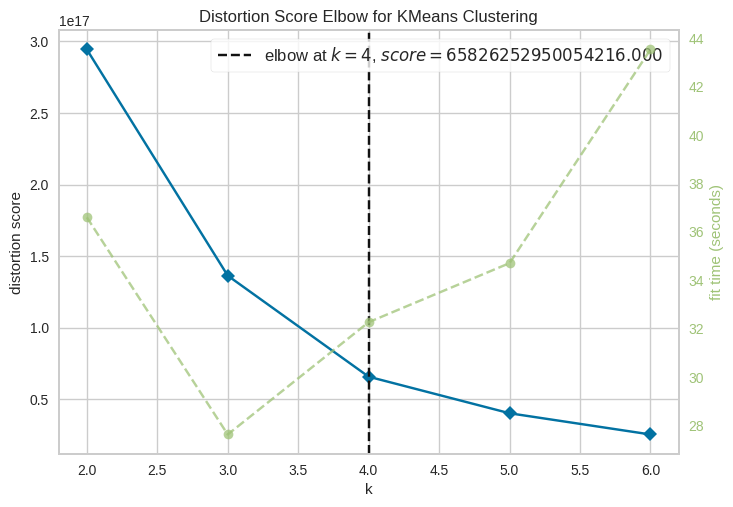

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [11]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn import preprocessing
import warnings
from sklearn.cluster import KMeans
warnings.filterwarnings('ignore')
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,7), locate_elbow=True)

visualizer.fit(train_eda)
visualizer.show() 

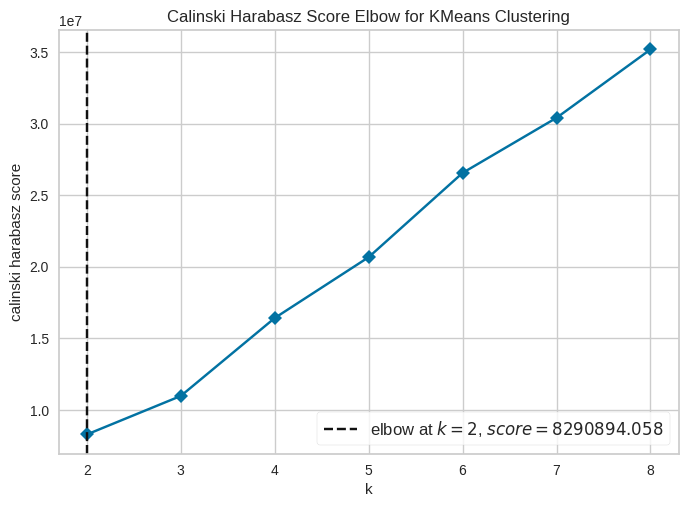

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [12]:
# from yellowbrick.cluster import KElbowVisualizer
# import warnings
# warnings.filterwarnings('ignore')
# from sklearn.cluster import KMeans
# model = KMeans()
# visualizer = KElbowVisualizer(model, k=(2,9), metric = 'calinski_harabasz', timings=False, locate_elbow=True)

# visualizer.fit(train_eda)
# visualizer.show() 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4933760 entries, 0 to 4933759
Data columns (total 20 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           uint32        
 1   date         datetime64[ns]
 2   store_nbr    uint8         
 3   item_nbr     uint32        
 4   unit_sales   float32       
 5   onpromotion  object        
 6   city         object        
 7   state        object        
 8   type_x       object        
 9   cluster      int8          
 10  family       object        
 11  class        int64         
 12  perishable   int64         
 13  type_y       object        
 14  locale       object        
 15  locale_name  object        
 16  description  object        
 17  transferred  object        
 18  dcoilwtico   object        
 19  avg_oil      object        
dtypes: datetime64[ns](1), float32(1), int64(2), int8(1), object(12), uint32(2), uint8(1)
memory usage: 668.1+ MB


###Predictions

In [24]:
from sklearn.cluster import KMeans
clusters = 4
km = KMeans(n_clusters = clusters, random_state = 10, init='random')
km.fit(train_eda) 
y=km.predict(train_eda)
train_eda["label"] = y
train_eda.head()

,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,year,month,day,label
0,1,-1.716991,1.754354,0.0,18,12,3,13,12,-0.82581,0,2.524936,1,-1.612943,-0.764549,-1.651868,3
1,1,-1.716991,0.238764,0.0,18,12,3,13,12,-0.82581,0,2.527677,0,-1.612943,-0.462563,-1.197523,3
2,1,-1.716991,0.055056,0.0,18,12,3,13,12,-0.82581,0,2.695463,0,-1.612943,-0.462563,0.506270,3
3,1,-1.716991,-0.036798,0.0,18,12,3,13,12,-0.82581,0,2.297384,0,-1.612943,0.443394,-0.175247,3
4,1,-1.716991,0.100983,0.0,18,12,3,13,12,-0.82581,0,0.748933,0,-1.612943,1.651336,-1.424695,3


In [39]:
train_eda

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day,label
0,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1,3
1,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5,3
2,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20,3
3,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14,3
4,36515701,1,115611,10.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,67.30,0,2,337,2014,12,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513480,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95,0,4,51,2015,2,20,0
3513481,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35,0,4,288,2016,10,14,0
3513482,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93,0,4,351,2016,12,16,0
3513483,102944669,51,1239986,4147.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,52.36,0,4,13,2017,1,13,0


In [38]:
train_eda["label"] = y
train_eda.head()
train_eda.to_csv(raw_path + "train_eda_labeled.csv", index=False)


In [25]:
print('Cluster 0:', f'{round(len(train_eda[train_eda.label == 0])/len(train_eda) *100, 2)}%')
print('Cluster 1:', f'{round(len(train_eda[train_eda.label == 1])/len(train_eda) *100, 2)}%')
print('Cluster 2:', f'{round(len(train_eda[train_eda.label == 2])/len(train_eda) *100, 2)}%')
print('Cluster 3:', f'{round(len(train_eda[train_eda.label == 3])/len(train_eda) *100, 2)}%') 

Cluster 0: 10.2%
Cluster 1: 21.63%
Cluster 2: 29.94%
Cluster 3: 38.24%


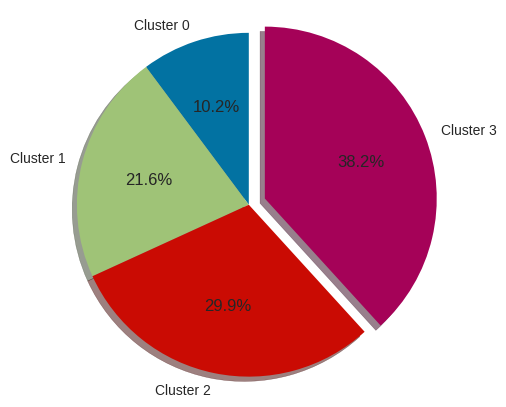

In [28]:
import matplotlib.pyplot as plt

labels = 'Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3'
sizes = [round(len(train_eda[train_eda.label == i])/len(train_eda) *100, 2) for i in range(4)]
explode = (0, 0, 0, 0.1)  


fig1, ax1 = plt.subplots(figsize = [5,5])
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  
plt.show()

In [29]:
train_eda.to_csv(raw_path + "not_encoded_labeled.csv", index=False)


In [ ]:
!pip install tfcausalimpact
from causalimpact import CausalImpact
import pandas as pd
df = pd.read_csv('/work/small/small_train.csv') 
df = df.sort_values(by = 'date')
     

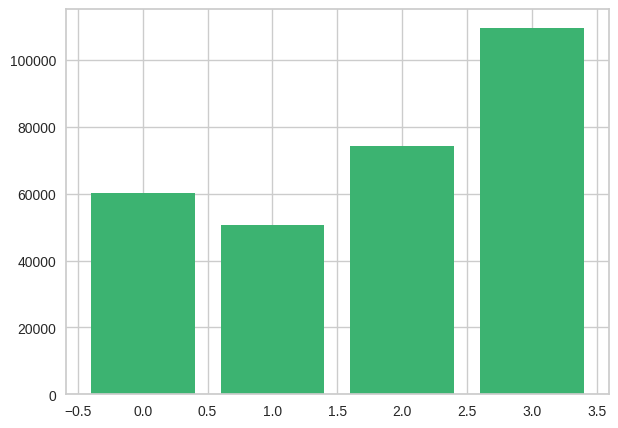

In [30]:
dfcl1 = train_eda.groupby('label').onpromotion.sum().reset_index()

fig = plt.figure(figsize = (7, 5))

plt.bar(dfcl1['label'], dfcl1['onpromotion'], color = 'mediumseagreen') 
plt.show()

Text(0, 0.5, 'Percentage on promotion')

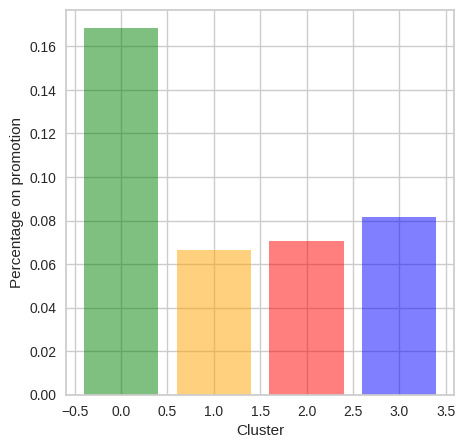

In [32]:
plt.figure(figsize=[5, 5]) #, dpi = 500

plt.bar(0, train_eda[train_eda.label == 0]['onpromotion'].astype(int).mean(), color = 'green', alpha=0.5 ) 
plt.bar(1, train_eda[train_eda.label == 1]['onpromotion'].astype(int).mean(), color = 'orange', alpha=0.5 )
plt.bar(2, train_eda[train_eda.label == 2]['onpromotion'].astype(int).mean(), color = 'red', alpha=0.5 )
plt.bar(3, train_eda[train_eda.label == 3]['onpromotion'].astype(int).mean(), color = 'blue', alpha=0.5 )
# plt.legend([f'Cluster {i}' for i in range(4)])
plt.xlabel('Cluster')
plt.ylabel('Percentage on promotion')
# plt.savefig('bar_1.png', dpi = 500)

Text(0, 0.5, 'Percentage of perishable')

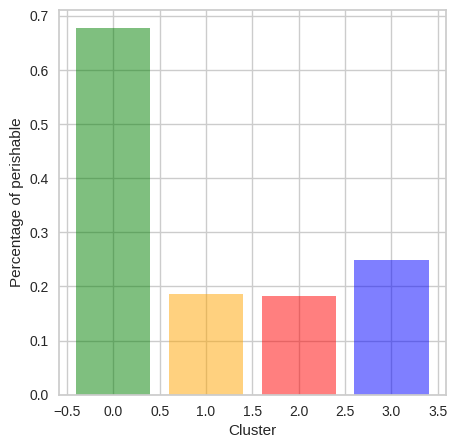

In [34]:
plt.figure(figsize=[5, 5]) #, dpi = 500

plt.bar(0, train_eda[train_eda.label == 0]['perishable'].astype(int).mean(), color = 'green', alpha=0.5 ) 
plt.bar(1, train_eda[train_eda.label == 1]['perishable'].astype(int).mean(), color = 'orange', alpha=0.5 )
plt.bar(2, train_eda[train_eda.label == 2]['perishable'].astype(int).mean(), color = 'red', alpha=0.5 )
plt.bar(3, train_eda[train_eda.label == 3]['perishable'].astype(int).mean(), color = 'blue', alpha=0.5 )
# plt.legend([f'Cluster {i}' for i in range(4)])
plt.xlabel('Cluster')
plt.ylabel('Percentage of perishable')
# plt.savefig('bar_1.png', dpi = 500)

##Models

In [4]:
df = pd.read_csv(raw_path + 'train_eda_labeled.csv', dtype = dtype_dict, index_col=False)

In [5]:
df

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,class,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day,label
0,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.69,1,1,91,2014,4,1,3
1,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,99.74,0,0,125,2014,5,5,3
2,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,102.80,0,1,140,2014,5,20,3
3,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,95.54,0,3,226,2014,8,14,3
4,36515701,1,115611,10.000000,0.0,Quito,Pichincha,D,13,GROCERY I,1014,0,67.30,0,2,337,2014,12,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513480,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,49.95,0,4,51,2015,2,20,0
3513481,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,50.35,0,4,288,2016,10,14,0
3513482,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,51.93,0,4,351,2016,12,16,0
3513483,102944669,51,1239986,4147.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,2420,1,52.36,0,4,13,2017,1,13,0


In [6]:
%%capture
!pip install tfcausalimpact


In [7]:
date = pd.to_datetime(df[['year', 'month', 'day']])
date

0         2014-04-01
1         2014-05-05
2         2014-05-20
3         2014-08-14
4         2014-12-03
             ...    
3513480   2015-02-20
3513481   2016-10-14
3513482   2016-12-16
3513483   2017-01-13
3513484   2017-08-15
Length: 3513485, dtype: datetime64[ns]

In [8]:
df['date'] = date
df

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,...,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day,label,date
0,21657671,1,115611,46.000000,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,99.69,1,1,91,2014,4,1,3,2014-04-01
1,23349772,1,115611,13.000000,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,99.74,0,0,125,2014,5,5,3,2014-05-05
2,24087515,1,115611,9.000000,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,102.80,0,1,140,2014,5,20,3,2014-05-20
3,29022175,1,115611,7.000000,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,95.54,0,3,226,2014,8,14,3,2014-08-14
4,36515701,1,115611,10.000000,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,67.30,0,2,337,2014,12,3,3,2014-12-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513480,41547484,51,1239986,26.309999,1.0,Guayaquil,Guayas,A,17,POULTRY,...,1,49.95,0,4,51,2015,2,20,0,2015-02-20
3513481,93890355,51,1239986,2594.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,...,1,50.35,0,4,288,2016,10,14,0,2016-10-14
3513482,100163926,51,1239986,2656.199951,1.0,Guayaquil,Guayas,A,17,POULTRY,...,1,51.93,0,4,351,2016,12,16,0,2016-12-16
3513483,102944669,51,1239986,4147.000000,1.0,Guayaquil,Guayas,A,17,POULTRY,...,1,52.36,0,4,13,2017,1,13,0,2017-01-13


In [9]:
from causalimpact import CausalImpact
df = df.sort_values(by = 'date')
# df['month'] = df.date.apply(lambda x: x[5:7]).values #once I calculated average promotions for a month but then I've actually never used it 
df

,id,store_nbr,item_nbr,unit_sales,onpromotion,city,state,type,cluster,family,...,perishable,dcoilwtico,is_holiday,day_of_week,day_of_year,year,month,day,label,date
0,21657671,1,115611,46.0,0.0,Quito,Pichincha,D,13,GROCERY I,...,0,99.69,1,1,91,2014,4,1,3,2014-04-01
122087,21681942,26,771156,4.0,0.0,Guayaquil,Guayas,D,10,CLEANING,...,0,99.69,1,1,91,2014,4,1,2,2014-04-01
1349911,21690287,36,830829,4.0,0.0,Libertad,Guayas,E,10,GROCERY I,...,0,99.69,1,1,91,2014,4,1,2,2014-04-01
1941535,21677730,19,554049,7.0,0.0,Guaranda,Bolivar,C,15,GROCERY I,...,0,99.69,1,1,91,2014,4,1,2,2014-04-01
1126421,21682655,27,401817,3.0,0.0,Daule,Guayas,D,1,GROCERY I,...,0,99.69,1,1,91,2014,4,1,2,2014-04-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
922089,125456563,36,939129,2.0,0.0,Libertad,Guayas,E,10,DAIRY,...,1,47.57,0,1,227,2017,8,15,2,2017-08-15
922221,125464438,40,939129,7.0,0.0,Machala,El Oro,C,3,DAIRY,...,1,47.57,0,1,227,2017,8,15,2,2017-08-15
2287792,125490849,51,1464210,17.0,0.0,Guayaquil,Guayas,A,17,BEVERAGES,...,0,47.57,0,1,227,2017,8,15,1,2017-08-15
921120,125446093,29,882624,8.0,0.0,Guayaquil,Guayas,E,10,DAIRY,...,1,47.57,0,1,227,2017,8,15,2,2017-08-15


In [12]:
fg = df.groupby('date').onpromotion.sum()/df.groupby('date').onpromotion.count()
fg

date
2014-04-01    0.000000
2014-04-02    0.000389
2014-04-03    0.003576
2014-04-04    0.000000
2014-04-07    0.000000
                ...   
2017-08-09    0.165912
2017-08-10    0.082412
2017-08-11    0.141926
2017-08-14    0.083994
2017-08-15    0.106037
Name: onpromotion, Length: 850, dtype: float64

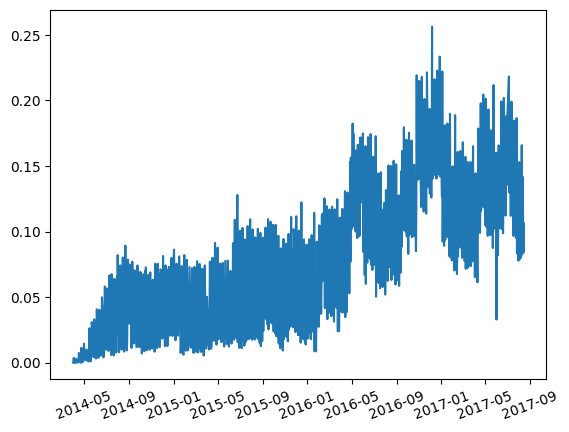

In [16]:
fg = df.groupby('date').onpromotion.sum()/df.groupby('date').onpromotion.count()
dic = {'date': fg.index, 'proms': fg.values}
new = pd.DataFrame(dic)
plt.plot(fg.index, fg.values)
plt.xticks(rotation=20)
plt.show()

In [77]:
from datetime import date
from datetime import datetime
time_point = datetime.strptime('2016-09-01',"%Y-%m-%d")
data.index[data['x'] == time_point].tolist()
# start

[611]

In [30]:
from datetime import date
df['start'] = pd.to_datetime(date(2014, 4, 1))
df['num_of_day'] = (df['date'] - df['start']).dt.days

In [78]:
redo = df.groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = df.num_of_day.unique()
data['x2'] = df.groupby('date').onpromotion.sum().values
# pre_period = ['2014-04-01', '2016-08-20'] 
# post_period = ['2016-08-21', '2017-08-15'] 

ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, 849],)

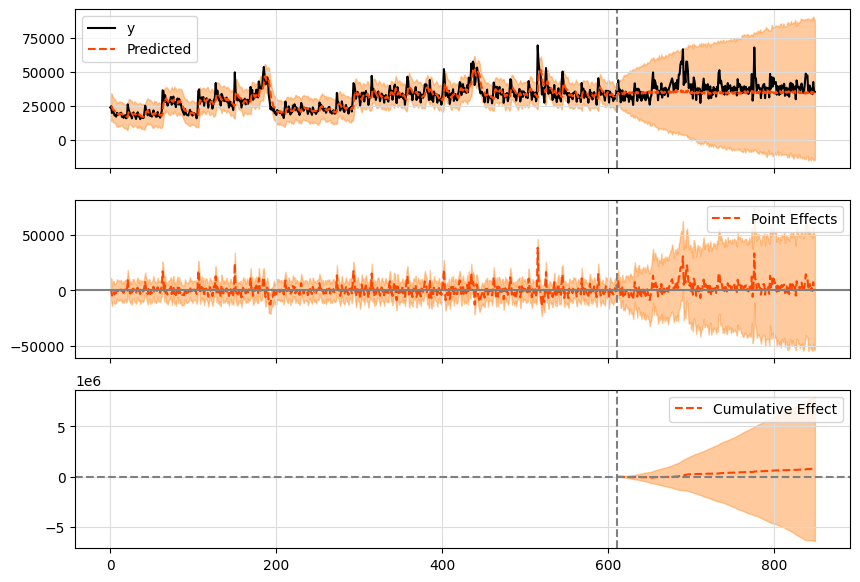

In [79]:
ci.plot()


In [80]:
print(ci.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    38071.05           9060910.0
Prediction (s.d.)         34750.45 (14988.91)8270606.0 (3567360.65)
95% CI                    [4069.42, 62824.88][968521.5, 14952321.22]

Absolute effect (s.d.)    3320.61 (14988.91) 790304.0 (3567360.65)
95% CI                    [-24753.83, 34001.63][-5891411.22, 8092388.5]

Relative effect (s.d.)    9.56% (43.13%)     9.56% (43.13%)
95% CI                    [-71.23%, 97.85%]  [-71.23%, 97.85%]

Posterior tail-area probability p: 0.4
Posterior prob. of a causal effect: 60.34%

For more details run the command: print(impact.summary('report'))


In [81]:
redo = df[df['type'] == 'A'].groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[df['type'] == 'A'].groupby('date').onpromotion.sum().values

In [82]:
data

,x,y,x1,x2
0,2014-04-01,7748.535156,0,0.0
1,2014-04-02,8685.134766,1,0.0
2,2014-04-03,6147.013184,2,0.0
3,2014-04-04,7309.348633,3,0.0
4,2014-04-07,6323.286133,4,0.0
...,...,...,...,...
845,2017-08-09,11777.828125,845,187.0
846,2017-08-10,10126.643555,846,71.0
847,2017-08-11,14925.574219,847,143.0
848,2017-08-14,10075.852539,848,75.0


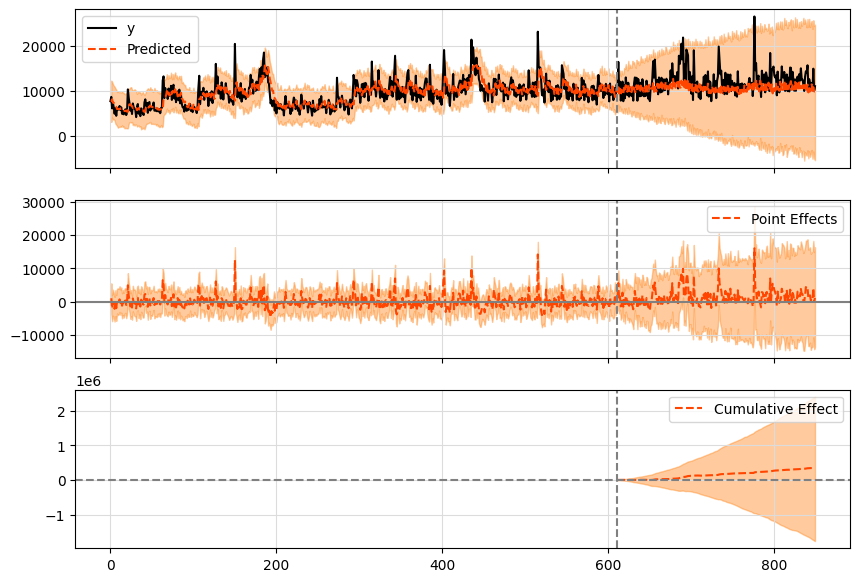

In [83]:
ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, len(data)-1], )
ci.plot()

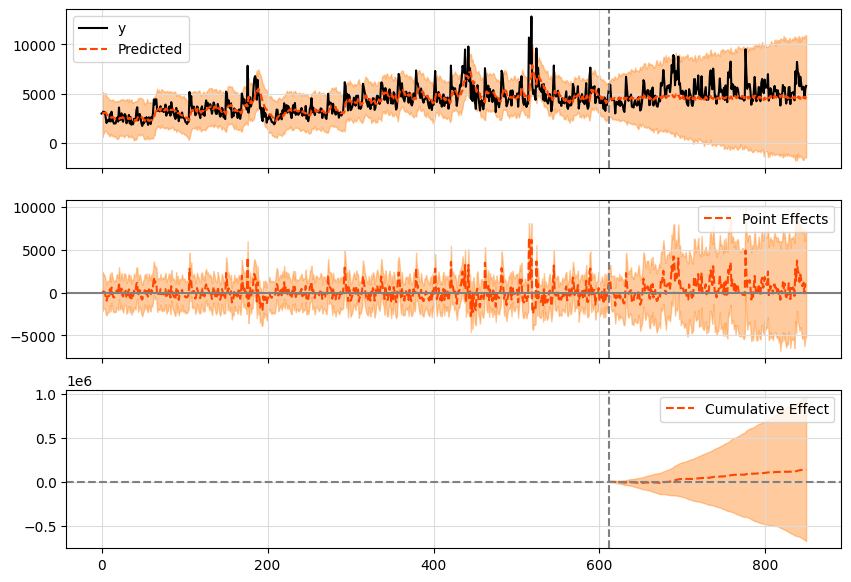

In [85]:
redo = df[df['type'] == 'B'].groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[df['type'] == 'B'].groupby('date').onpromotion.sum().values
ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, len(data)-1], )
ci.plot()

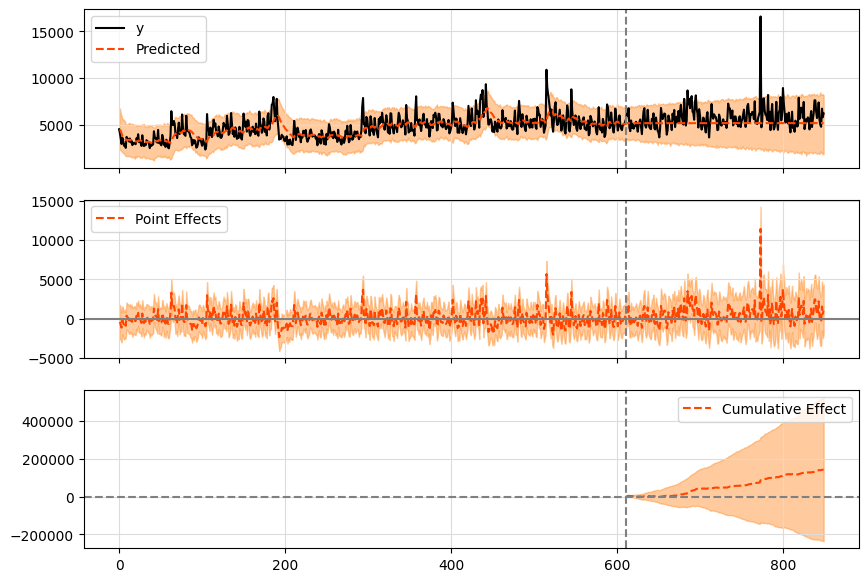

In [86]:
redo = df[df['type'] == 'C'].groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[df['type'] == 'C'].groupby('date').onpromotion.sum().values
ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, len(data)-1], )
ci.plot()

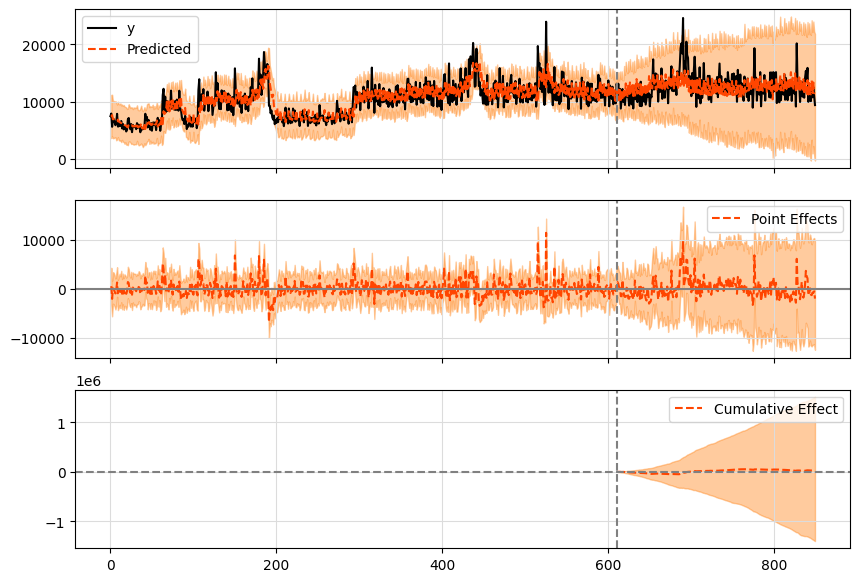

In [87]:
redo = df[df['type'] == 'D'].groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[df['type'] == 'D'].groupby('date').onpromotion.sum().values
ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, len(data)-1], )
ci.plot()

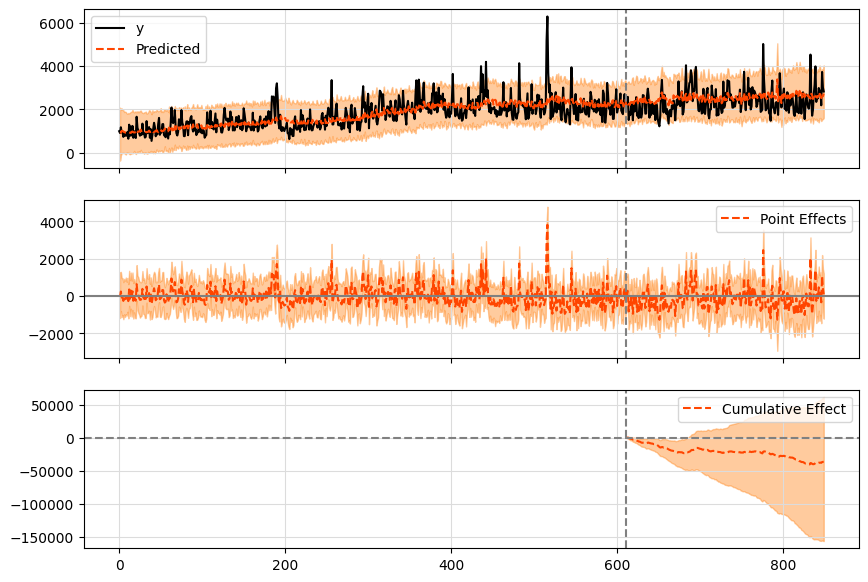

In [88]:
redo = df[df['type'] == 'E'].groupby('date').unit_sales.sum()
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[df['type'] == 'E'].groupby('date').onpromotion.sum().values
ci = CausalImpact(data[['y', 'x1', 'x2']], [0, 611], [611+1, len(data)-1], )
ci.plot()

In [89]:
#collecting data on long promotion of certain items
from tqdm import tqdm
df = df.sort_values(by = 'date')
dic = {'count':[], 'i':[], 'j':[], 'goods_c':[]}
for i in tqdm(df.item_nbr.unique(), total = len(df.item_nbr.unique())):
    count, goods_c = 0, 0
    prom = df[df.item_nbr == i]
    for j in prom.date.unique():
        if prom[(prom.date == j)].onpromotion.sum()/len(prom[(prom.date == j)]) == 1:
            count += 1
            goods_c += prom[(prom.date == j)].onpromotion.sum()
            if count > 14:
                dic['i'].append(i)
                dic['count'].append(count)
                dic['j'].append(j)
                dic['goods_c'].append(goods_c)
        else: 
            count, goods_c = 0, 0

100%|██████████| 4014/4014 [45:02<00:00,  1.49it/s]


In [90]:

goods = pd.DataFrame(dic)
goods.to_csv('goods_promo.csv', index = False)

In [91]:
goods

,count,i,j,goods_c
0,15,838415,2017-05-30,35.0
1,16,838415,2017-05-31,36.0
2,15,253103,2016-05-26,31.0
3,16,253103,2016-05-27,33.0
4,17,253103,2016-05-31,34.0
...,...,...,...,...
4477,19,2051064,2017-07-19,39.0
4478,20,2051064,2017-07-20,40.0
4479,15,2056557,2017-07-06,35.0
4480,15,2061404,2017-05-31,38.0


In [92]:
goods.sort_values(by = 'count', ascending = False)


,count,i,j,goods_c
4150,83,1926106,2016-12-30,164.0
4149,82,1926106,2016-12-29,162.0
4148,81,1926106,2016-12-28,161.0
4147,80,1926106,2016-12-27,158.0
4146,79,1926106,2016-12-23,155.0
...,...,...,...,...
2227,15,586911,2016-12-08,36.0
2226,15,664539,2016-06-30,37.0
2212,15,1229576,2017-01-04,34.0
2186,15,1167487,2016-08-30,22.0


In [108]:
idx = []
for n in goods.i.unique():
    prom = goods[goods.i == n]
    idx += list(prom[prom['count'] != prom['count'].max()].index)
goods = goods.drop(index = idx)
goods = goods[goods['count']*2 < goods.goods_c]
goods.sort_values(by = 'count', ascending = False)

,count,i,j,goods_c
1117,76,346065,2016-10-31,183.0
902,61,215896,2016-10-31,127.0
3141,55,1463862,2017-01-17,153.0
2861,53,1463808,2017-02-08,142.0
2499,51,1463865,2017-01-17,105.0
...,...,...,...,...
2099,15,849136,2017-02-15,41.0
2068,15,619965,2017-07-25,35.0
2055,15,1047786,2016-12-23,32.0
2034,15,838413,2017-04-26,40.0


###categories impact

In [113]:
#Causal impact on Category sales of one item with longest promotion
item = 1456952
fam = 'HOME CARE'
dic = {'date': df[(df.item_nbr == item)].groupby('date').unit_sales.sum().index, 'value': list(df[(df.item_nbr == 1456952)].groupby('date').unit_sales.sum().values)}
count = 0
for i in df[(df.family == fam) & (df.item_nbr != item)].groupby('date').onpromotion.sum().index:
    if i not in dic['date']:
        dic['value'].insert(count, 0)
    count+=1

In [96]:
data.index[data['x'] == time_point].tolist()


[611]

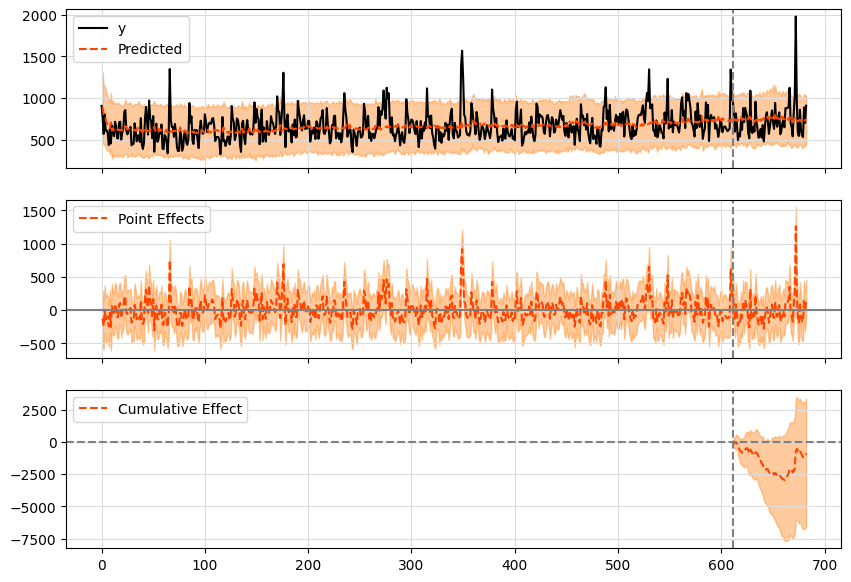

In [114]:
redo = df[(df.family == fam) & (df.item_nbr != item)].groupby('date').unit_sales.sum()
vals = df[(df.family == fam)].groupby('date').unit_sales.sum() - redo
data = pd.DataFrame({'x': redo.index, 'y': redo.values})
data['x1'] = range(len(data))
data['x2'] = df[(df.family == fam) & (df.item_nbr != item)].groupby('date').onpromotion.sum().values
data['x3'] = vals.values
ci = CausalImpact(data[['y', 'x1', 'x2', 'x3']], [0, 611], [611+1, len(data)-1], )
ci.plot()

In [115]:
print(ci.summary())


Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    732.49             52007.0
Prediction (s.d.)         745.17 (34.99)     52907.04 (2484.44)
95% CI                    [683.42, 820.59]   [48523.02, 58261.85]

Absolute effect (s.d.)    -12.68 (34.99)     -900.04 (2484.44)
95% CI                    [-88.1, 49.07]     [-6254.85, 3483.98]

Relative effect (s.d.)    -1.7% (4.7%)       -1.7% (4.7%)
95% CI                    [-11.82%, 6.59%]   [-11.82%, 6.59%]

Posterior tail-area probability p: 0.36
Posterior prob. of a causal effect: 63.74%

For more details run the command: print(impact.summary('report'))


In [112]:
data

,x,y,x1,x2,x3
0,2014-04-01,9609.000000,0,0.0,7.0
1,2014-04-02,10623.000000,1,0.0,13.0
2,2014-04-03,7780.000000,2,0.0,0.0
3,2014-04-04,7917.000000,3,0.0,26.0
4,2014-04-07,8499.880859,4,0.0,55.0
...,...,...,...,...,...
845,2017-08-09,11461.000000,845,157.0,11.0
846,2017-08-10,11093.000000,846,106.0,24.0
847,2017-08-11,11561.828125,847,119.0,0.0
848,2017-08-14,10800.375000,848,117.0,6.0


In [ ]:
store_sales = train.drop('id',axis=1).set_index(['store_nbr','family','date'])

family_sales = store_sales.unstack(['store_nbr','family']).loc['2017']
# family_sales.index = family_sales.index.to_period('D')
family_sales
# store_sales

sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-01-01        0.0       0.0    0.0       0.0   0.0     0.000000   
2017-01-02        5.0       0.0    0.0    1434.0   0.0   166.819000   
2017-01-03        4.0       0.0    4.0    3081.0   2.0   519.348022   
2017-01-04        1.0       0.0    4.0    3039.0   2.0   543.250977   
2017-01-05        2.0       0.0    3.0    2617.0   0.0   533.479980   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0   145.606995   
2017-08-12        6.0       0.0    3.0    1659.0   0.0   243.220001   
2017-08-13        1.0       0.0    1.0     803.0   0.0   136.679001   
2017-08-14        1.0       0.0    6.0    2201.0   0.0   346.037994   
2017-08-15        4.0       0.0    4.0    1942.0   0.0   329.541016   

                                                     ... onpromotion        \
store_nbr                                            ...           9         
family     CELEBRATION CLEANING   DAIRY        DELI  ...   MAGAZINES MEATS   
date                                                 ...                     
2017-01-01         0.0      0.0     0.0    0.000000  ...           0     0   
2017-01-02         0.0    332.0   376.0   44.980000  ...           0     0   
2017-01-03        15.0    952.0  1045.0  209.300003  ...           0     0   
2017-01-04        17.0   1055.0  1029.0  135.944000  ...           0     0   
2017-01-05        40.0    918.0   853.0  137.005997  ...           0    21   
...                ...      ...     ...         ...  ...         ...   ...   
2017-08-11         4.0    341.0   343.0   64.302002  ...           0     0   
2017-08-12         3.0    351.0   526.0   99.487999  ...           0     0   
2017-08-13         1.0    169.0   266.0   47.770000  ...           0     0   
2017-08-14         4.0    571.0   699.0  154.578003  ...           0     0   
2017-08-15        21.0    703.0   602.0  116.402000  ...           0     0   

                                                                       \
store_nbr                                                               
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS POULTRY   
date                                                                    
2017-01-01             0            0                       0       0   
2017-01-02            13            0                       0       2   
2017-01-03            11            0                       0       1   
2017-01-04            15            0                       0       1   
2017-01-05             8            0                       0       1   
...                  ...          ...                     ...     ...   
2017-08-11            11            0                       0      22   
2017-08-12             7            0                       0       0   
2017-08-13             9            0                       0       0   
2017-08-14            10            0                       0       0   
2017-08-15            11            0                       0       0   

                                                                      
store_nbr                                                             
family     PREPARED FOODS PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                  
2017-01-01              0       0                          0       0  
2017-01-02              1       4                          0       0  
2017-01-03              2     150                          0       0  
2017-01-04              8       9                          0       0  
2017-01-05              1       5                          0       1  
...                   ...     ...           

In [ ]:
store_sales = train.set_index(['store_nbr','family','date'])
store_sales.tail()

id        sales  \
store_nbr family                     date                               
9         POULTRY                    2017-08-15  3000883   438.132996   
          PREPARED FOODS             2017-08-15  3000884   154.552994   
          PRODUCE                    2017-08-15  3000885  2419.729004   
          SCHOOL AND OFFICE SUPPLIES 2017-08-15  3000886   121.000000   
          SEAFOOD                    2017-08-15  3000887    16.000000   

                                                 onpromotion  
store_nbr family                     date                     
9         POULTRY                    2017-08-15            0  
          PREPARED FOODS             2017-08-15            1  
          PRODUCE                    2017-08-15          148  
          SCHOOL AND OFFICE SUPPLIES 2017-08-15            8  
          SEAFOOD                    2017-08-15            0

In [ ]:
avg_sales = store_sales.groupby('date')['sales'].mean().to_frame()
avg_prom = store_sales.groupby('date')['onpromotion'].mean().to_frame()

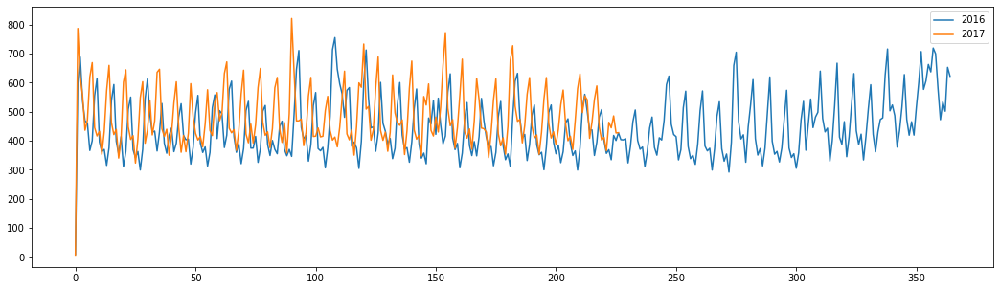

In [ ]:
plt.figure(figsize=(18,5))
plt.plot(avg_sales.loc['2016'].values, label='2016')
plt.plot(avg_sales.loc['2017'].values, label ='2017')
plt.legend()
plt.show()

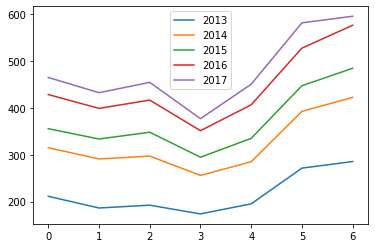

In [ ]:
avg_sales['dow'] = avg_sales.index.weekday.to_list()
fig = plt.figure()
for i in ['2013','2014','2015','2016','2017']:
    plt.plot(avg_sales.loc[i].groupby('dow').mean(), label=i)
plt.legend()
plt.show()

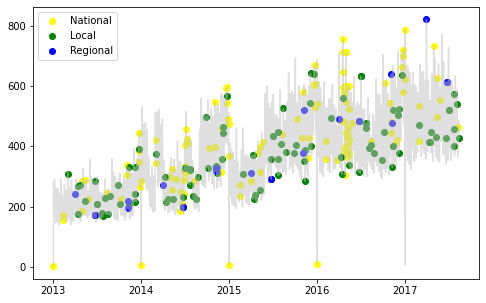

In [ ]:
# holidays.set_index('date',inplace=True)
hol = holidays.loc[holidays.index.isin(avg_sales.index)]
hol_nat = hol.loc[(hol['locale']=='National') & 
                  (hol['transferred']!=True) & 
                  (hol['type']!='Work Day')]
hol_local = hol.loc[(hol['locale']=='Local') & 
                  (hol['transferred']!=True) & 
                  (hol['type']!='Work Day')]
hol_reg = hol.loc[(hol['locale']=='Regional') & 
                  (hol['transferred']!=True) & 
                  (hol['type']!='Work Day')]

fig = plt.figure(figsize=(8,5))
#plt.plot_date(hol.index,avg_sales.sales.loc[hol.index],color='red')
plt.plot_date(hol_nat.index,avg_sales.sales.loc[(hol_nat.index)],color='yellow',label='National')
plt.plot_date(hol_local.index,avg_sales.sales.loc[(hol_local.index)],color='green',label = 'Local')
plt.plot_date(hol_reg.index,avg_sales.sales.loc[(hol_reg.index)],color='blue',label = 'Regional')
plt.legend()
plt.plot(avg_sales['sales'],alpha=0.5,color='silver')
plt.show()

In [ ]:
hol_test = holidays.loc[holidays.index.isin(test.index)]
hol_test

,type,locale,locale_name,description,transferred
date,,,,,
2017-08-24,Holiday,Local,Ambato,Fundacion de Ambato,False


In [ ]:
from sklearn.preprocessing import MinMaxScaler

def mm_scale_column(df,colname):
    mm_scaler = MinMaxScaler()
    mm_scaler.fit(df[colname].values.reshape(-1,1))
    df['{}_scaled'.format(colname)] = mm_scaler.transform(df[colname].values.reshape(-1,1))
    return df

In [ ]:
mm_scale_column(transactions,'transactions')
# mm_scale_column(oil_data,'oil_price')
# mm_scale_column(oil_data,'price_chg')
mm_scale_column(avg_prom,'onpromotion')
mm_scale_column(avg_sales,'sales')

,sales,dow,sales_scaled
date,,,
2013-01-01,1.409438,1,0.000000
2013-01-02,278.390808,2,0.337937
2013-01-03,202.840195,3,0.245760
2013-01-04,198.911148,4,0.240966
2013-01-05,267.873230,5,0.325104
...,...,...,...
2017-08-11,463.733856,4,0.564068
2017-08-12,444.798279,5,0.540965
2017-08-13,485.768616,6,0.590952


corretaion = transactions_scaled    0.092478
dtype: float64


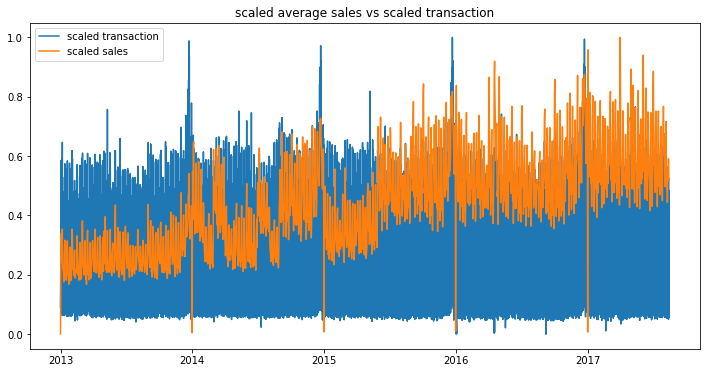

In [ ]:
corr = transactions['transactions_scaled'].to_frame().corrwith(avg_sales['sales_scaled'])
print('corretaion = {}'.format(corr))

fig = plt.figure(figsize=(12,6))
plt.title('scaled average sales vs scaled transaction')
plt.plot(transactions['transactions_scaled'],label='scaled transaction')
plt.plot(avg_sales['sales_scaled'],label='scaled sales')
plt.legend()
plt.show()

corretaion = onpromotion_scaled    0.574943
dtype: float64


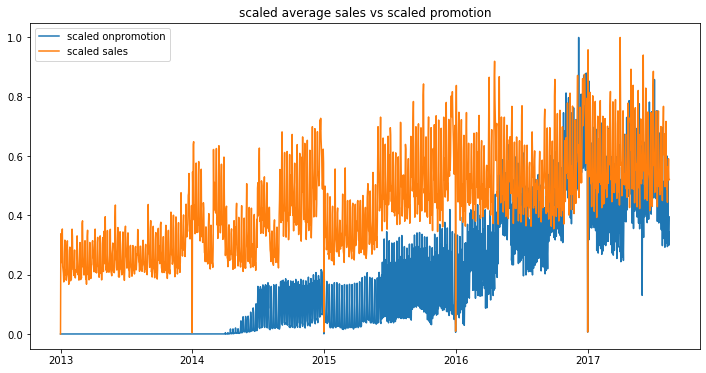

In [ ]:
corr = avg_prom['onpromotion_scaled'].to_frame().corrwith(avg_sales['sales_scaled'])
print('corretaion = {}'.format(corr))

fig = plt.figure(figsize=(12,6))
plt.title('scaled average sales vs scaled promotion')
plt.plot(avg_prom['onpromotion_scaled'],label='scaled onpromotion')
plt.plot(avg_sales['sales_scaled'],label='scaled sales')
plt.legend()
plt.show()

In [ ]:
X = avg_sales.copy()
X.drop('sales_scaled',axis=1,inplace=True)
X['weekofyear'] = X.index.isocalendar().week
X['quarter'] = X.index.quarter
X['month'] = X.index.month
X['dayofyear'] = X.index.dayofyear
X = pd.get_dummies(X, columns=['dow'])

#new year day that cause the sale to drop significantly
X['is_ny'] = 0
X.loc[X['dayofyear']==1, 'is_ny'] = 1

#payday over bi-weekly
X['payday'] = False
# X.loc[(X['month']!=X['month'].shift(-1)), 'payday'] = True
# X.loc[X.index.day == 15, 'payday'] = True
X['day_in_m'] = X.index.days_in_month
X['payday'] = (X.index.day == 16) | (X.index.day == 1) | (X.index.day == 14) | (X.index.day == X['day_in_m'] - 1) | (X.index.day == 15) | (X.index.day == X['day_in_m'])
X.drop(columns='day_in_m', inplace=True, axis=1)

In [ ]:
X.loc[X['payday'] == True]

,sales,weekofyear,quarter,month,dayofyear,dow_0,dow_1,dow_2,dow_3,dow_4,dow_5,dow_6,is_ny,payday
date,,,,,,,,,,,,,,
2013-01-01,1.409438,1,1,1,1,0,1,0,0,0,0,0,1,True
2013-01-14,164.617493,3,1,1,14,1,0,0,0,0,0,0,0,True
2013-01-15,167.861694,3,1,1,15,0,1,0,0,0,0,0,0,True
2013-01-16,178.646423,3,1,1,16,0,0,1,0,0,0,0,0,True
2013-01-30,157.722290,5,1,1,30,0,0,1,0,0,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-30,630.613037,30,3,7,211,0,0,0,0,0,0,1,0,True
2017-07-31,497.113831,31,3,7,212,1,0,0,0,0,0,0,0,True
2017-08-01,554.729370,31,3,8,213,0,1,0,0,0,0,0,0,True


In [ ]:
test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [ ]:
test.set_index('date',inplace=True)

In [ ]:
f_test = test.copy()
f_test['dow'] = f_test.index.weekday
f_test['weekofyear'] = f_test.index.isocalendar().week
f_test['quarter'] = f_test.index.quarter
f_test['month'] = f_test.index.month
f_test['dayofyear'] = f_test.index.dayofyear
f_test = pd.get_dummies(f_test, columns=['dow'])

#new year day that cause the sale to drop significantly
f_test['is_ny'] = 0
f_test.loc[f_test['dayofyear']==1, 'is_ny'] = 1

#payday over bi-weekly
f_test['payday'] = False
f_test.loc[(f_test['month']!=f_test['month'].shift(-1)), 'payday'] = True
f_test.loc[f_test.index.day == 31, 'payday'] = True

formatting for holidays

In [ ]:
hol_X = holidays.copy()
hol_X = hol.loc[hol.locale.isin(['National','Regional'])]

#do the same for test
hol_test = hol_test.loc[hol_test.locale.isin(['National','Regional'])]

In [ ]:
hol_X

,type,locale,locale_name,description,transferred
date,,,,,
2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False
2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False
2013-01-12,Work Day,National,Ecuador,Recupero puente primer dia del ano,False
2013-02-11,Holiday,National,Ecuador,Carnaval,False
2013-02-12,Holiday,National,Ecuador,Carnaval,False
...,...,...,...,...,...
2017-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True
2017-05-26,Transfer,National,Ecuador,Traslado Batalla de Pichincha,False
2017-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False


In [ ]:
hol_X['is_hol'] = 1
hol_X.loc[hol_X['transferred']==True, 'is_hol'] = 0
hol_X = pd.get_dummies(hol_X.drop(['locale','locale_name','description','transferred'], axis=1), columns=['type'])

In [ ]:
X = X.merge(hol_X,how='left',left_index=True,right_index=True)
X = X.fillna(0)
X.loc[X['type_Work Day'] == 1, 'is_hol'] = 0
X.loc[X['dow_5']==1, 'is_hol'] = 1
X.loc[X['dow_6']==1, 'is_hol'] = 1
X.drop('type_Work Day',axis=1,inplace=True)

In [ ]:
f_test[['is_hol','type_Additional','type_Bridge','type_Event','type_Holiday','type_Transfer']] = 0
f_test.loc[f_test['dow_5']==1, 'is_hol'] = 1
f_test.loc[f_test['dow_6']==1, 'is_hol'] = 1

In [ ]:
X = X.dropna()
f_test = f_test.dropna()

In [ ]:
store_sales

id        sales  \
store_nbr family                     date                               
1         AUTOMOTIVE                 2013-01-01        0     0.000000   
          BABY CARE                  2013-01-01        1     0.000000   
          BEAUTY                     2013-01-01        2     0.000000   
          BEVERAGES                  2013-01-01        3     0.000000   
          BOOKS                      2013-01-01        4     0.000000   
...                                                  ...          ...   
9         POULTRY                    2017-08-15  3000883   438.132996   
          PREPARED FOODS             2017-08-15  3000884   154.552994   
          PRODUCE                    2017-08-15  3000885  2419.729004   
          SCHOOL AND OFFICE SUPPLIES 2017-08-15  3000886   121.000000   
          SEAFOOD                    2017-08-15  3000887    16.000000   

                                                 onpromotion  
store_nbr family                     date                     
1         AUTOMOTIVE                 2013-01-01            0  
          BABY CARE                  2013-01-01            0  
          BEAUTY                     2013-01-01            0  
          BEVERAGES                  2013-01-01            0  
          BOOKS                      2013-01-01            0  
...                                                      ...  
9         POULTRY                    2017-08-15            0  
          PREPARED FOODS             2017-08-15            1  
          PRODUCE                    2017-08-15          148  
          SCHOOL AND OFFICE SUPPLIES 2017-08-15            8  
          SEAFOOD                    2017-08-15            0  

[3000888 rows x 3 columns]

In [ ]:
y_ = store_sales.dropna()['sales'].to_frame().unstack(['store_nbr','family'])
y_train = y_.loc['2016-01-01':'2016-12-31']


In [ ]:
# y_.loc['2017']

#### LinReg

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
X_train = X.dropna().drop('sales',axis=1)
X_train = X_train[~X_train.index.duplicated()]
X_train = X_train.loc['2016-01-01':'2016-12-31']
X_train

,weekofyear,quarter,month,dayofyear,dow_0,dow_1,dow_2,dow_3,dow_4,dow_5,dow_6,is_ny,payday
date,,,,,,,,,,,,,
2016-01-01,53,1,1,1,0,0,0,0,1,0,0,1,True
2016-01-02,53,1,1,2,0,0,0,0,0,1,0,0,False
2016-01-03,53,1,1,3,0,0,0,0,0,0,1,0,False
2016-01-04,1,1,1,4,1,0,0,0,0,0,0,0,False
2016-01-05,1,1,1,5,0,1,0,0,0,0,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-27,52,4,12,362,0,1,0,0,0,0,0,0,False
2016-12-28,52,4,12,363,0,0,1,0,0,0,0,0,False
2016-12-29,52,4,12,364,0,0,0,1,0,0,0,0,False


In [ ]:
y_

sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01        0.0       0.0    0.0       0.0   0.0     0.000000   
2013-01-02        2.0       0.0    2.0    1091.0   0.0   470.652008   
2013-01-03        3.0       0.0    0.0     919.0   0.0   310.654999   
2013-01-04        3.0       0.0    3.0     953.0   0.0   198.365997   
2013-01-05        5.0       0.0    3.0    1160.0   0.0   301.057007   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0   145.606995   
2017-08-12        6.0       0.0    3.0    1659.0   0.0   243.220001   
2017-08-13        1.0       0.0    1.0     803.0   0.0   136.679001   
2017-08-14        1.0       0.0    6.0    2201.0   0.0   346.037994   
2017-08-15        4.0       0.0    4.0    1942.0   0.0   329.541016   

                                                    ...                        \
store_nbr                                           ...         9               
family     CELEBRATION CLEANING  DAIRY        DELI  ... MAGAZINES       MEATS   
date                                                ...                         
2013-01-01         0.0      0.0    0.0    0.000000  ...       0.0    0.000000   
2013-01-02         0.0   1060.0  579.0  164.069000  ...       0.0  374.531006   
2013-01-03         0.0    836.0  453.0  151.582001  ...       0.0  400.863007   
2013-01-04         0.0    827.0  460.0  131.410995  ...       0.0  310.877991   
2013-01-05         0.0    811.0  464.0  118.612999  ...       0.0  447.684998   
...                ...      ...    ...         ...  ...       ...         ...   
2017-08-11         4.0    341.0  343.0   64.302002  ...       5.0  309.244995   
2017-08-12         3.0    351.0  526.0   99.487999  ...       2.0  260.298004   
2017-08-13         1.0    169.0  266.0   47.770000  ...       3.0  327.205994   
2017-08-14         4.0    571.0  699.0  154.578003  ...      12.0  330.975006   
2017-08-15        21.0    703.0  602.0  116.402000  ...      11.0  449.227997   

                                                                           \
store_nbr                                                                   
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS     POULTRY   
date                                                                        
2013-01-01           0.0          0.0                     0.0    0.000000   
2013-01-02         482.0          0.0                     0.0  651.291992   
2013-01-03         372.0          0.0                     0.0  509.496002   
2013-01-04         324.0          0.0                     0.0  332.671997   
2013-01-05         461.0          0.0                     0.0  510.919006   
...                  ...          ...                     ...         ...   
2017-08-11         373.0         11.0                     2.0  525.223999   
2017-08-12         400.0          7.0                    10.0  383.386993   
2017-08-13         510.0          2.0                     9.0  412.458008   
2017-08-14         445.0          2.0                    14.0  283.428986   
2017-08-15         522.0          6.0                     6.0  438.132996   

                                                                              
store_nbr                                                                     
family     PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES    SEAFOOD  
date                                                                          
2013-01-01       0.000000     0.000000                        0.0   0.000000  
2013-01-02      83.000000     0.000000                        0.0  29.214001  
2013-01-03      66.000000     0.000000                        0.0  25.000000  
2013-01-04      57.000000

In [ ]:
X

,sales,weekofyear,quarter,month,dayofyear,dow_0,dow_1,dow_2,dow_3,dow_4,dow_5,dow_6,is_ny,payday
date,,,,,,,,,,,,,,
2013-01-01,1.409438,1,1,1,1,0,1,0,0,0,0,0,1,True
2013-01-02,278.390808,1,1,1,2,0,0,1,0,0,0,0,0,False
2013-01-03,202.840195,1,1,1,3,0,0,0,1,0,0,0,0,False
2013-01-04,198.911148,1,1,1,4,0,0,0,0,1,0,0,0,False
2013-01-05,267.873230,1,1,1,5,0,0,0,0,0,1,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,463.733856,32,3,8,223,0,0,0,0,1,0,0,0,False
2017-08-12,444.798279,32,3,8,224,0,0,0,0,0,1,0,0,False
2017-08-13,485.768616,32,3,8,225,0,0,0,0,0,0,1,0,False


In [ ]:
lr.fit(X_train, y_train)

LinearRegression()

In [ ]:
f_test = f_test[~f_test.index.duplicated()]
f_test

,id,store_nbr,family,onpromotion,weekofyear,quarter,month,dayofyear,dow_0,dow_1,...,dow_5,dow_6,is_ny,payday,is_hol,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer
date,,,,,,,,,,,,,,,,,,,,,
2017-08-16,3000888,1,AUTOMOTIVE,0,33,3,8,228,0,0,...,0,0,0,False,0,0,0,0,0,0
2017-08-17,3002670,1,AUTOMOTIVE,0,33,3,8,229,0,0,...,0,0,0,False,0,0,0,0,0,0
2017-08-18,3004452,1,AUTOMOTIVE,0,33,3,8,230,0,0,...,0,0,0,False,0,0,0,0,0,0
2017-08-19,3006234,1,AUTOMOTIVE,0,33,3,8,231,0,0,...,1,0,0,False,1,0,0,0,0,0
2017-08-20,3008016,1,AUTOMOTIVE,0,33,3,8,232,0,0,...,0,1,0,False,1,0,0,0,0,0
2017-08-21,3009798,1,AUTOMOTIVE,0,34,3,8,233,1,0,...,0,0,0,False,0,0,0,0,0,0
2017-08-22,3011580,1,AUTOMOTIVE,0,34,3,8,234,0,1,...,0,0,0,False,0,0,0,0,0,0
2017-08-23,3013362,1,AUTOMOTIVE,0,34,3,8,235,0,0,...,0,0,0,False,0,0,0,0,0,0
2017-08-24,3015144,1,AUTOMOTIVE,0,34,3,8,236,0,0,...,0,0,0,False,0,0,0,0,0,0


In [ ]:
X_test = X.loc['2017-01-01':]
X_test = X_test.dropna().drop('sales',axis=1)

In [ ]:
y_pred = pd.DataFrame(lr.predict(X_test))
y_pred

,0,1,2,3,4,5,6,7,8,9,...,1772,1773,1774,1775,1776,1777,1778,1779,1780,1781
0,-2.596957,0.0,-1.474509,-1174.367215,-0.196315,-253.161459,-18.733165,-478.918682,-424.176766,-95.735380,...,2.744887,172.780315,340.838881,5.108559,6.535174,211.167431,55.330177,1086.306042,8.171653,14.282775
1,5.742712,0.0,2.551240,2182.859221,-0.311664,441.876933,13.241674,770.744022,803.688397,140.988501,...,1.873948,425.067564,605.871776,4.828006,7.376008,490.090201,95.383490,1462.926455,5.365584,20.382861
2,6.063137,0.0,2.105690,2072.501358,-0.456732,410.276707,15.423857,781.261747,760.663215,129.274449,...,1.809328,414.045842,586.000204,4.195513,6.832283,463.948462,98.335766,2231.661821,4.360985,18.857971
3,5.944503,0.0,2.488684,2308.505118,-0.413881,484.989196,18.880333,895.135995,933.967932,140.979106,...,1.680864,389.127789,512.016342,4.696575,6.637344,400.682935,93.637520,1258.358130,6.166378,18.277257
4,5.185348,0.0,2.464093,1932.209654,-0.520249,409.436977,17.231038,747.400482,721.106221,119.756011,...,1.612362,529.681901,487.351202,3.435127,6.784925,390.719109,93.123194,1209.589675,2.990100,18.128974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,4.508855,0.0,3.276051,2267.261565,0.439588,423.157816,24.152052,762.677054,806.808116,155.156400,...,3.343460,306.407439,402.463594,4.530186,8.278509,484.754262,90.721941,1234.518194,8.690500,14.179606
223,5.026540,0.0,3.119329,2330.245257,0.534790,409.061725,16.814963,638.034267,808.937391,138.991516,...,5.847965,424.176144,644.849881,7.581555,13.628999,590.527958,135.877246,1850.236643,16.736051,24.667722
224,1.873372,0.0,1.788867,1086.546458,0.269480,167.107503,5.251972,275.910250,377.752267,58.921592,...,6.227742,472.461056,730.668114,9.639148,14.833890,687.639974,144.704465,2312.365916,16.311915,27.923986
225,4.663017,0.0,3.610130,2302.321102,0.566994,444.829278,13.508810,752.199489,803.376669,148.011295,...,3.312451,403.092290,554.882786,6.559720,9.443295,492.064772,105.457830,1536.994401,5.690196,15.361186


In [ ]:
submit_df = pd.DataFrame(y_pred)
submit_df.columns = y_.columns
submit_df.index = X_test.index
# submit_df = submit_df.stack(['store_nbr','family']).reset_index()


In [ ]:
submit_df

sales                                                          \
store_nbr           1                                                           
family     AUTOMOTIVE BABY CARE    BEAUTY    BEVERAGES     BOOKS BREAD/BAKERY   
date                                                                            
2017-01-01  -2.596957       0.0 -1.474509 -1174.367215 -0.196315  -253.161459   
2017-01-02   5.742712       0.0  2.551240  2182.859221 -0.311664   441.876933   
2017-01-03   6.063137       0.0  2.105690  2072.501358 -0.456732   410.276707   
2017-01-04   5.944503       0.0  2.488684  2308.505118 -0.413881   484.989196   
2017-01-05   5.185348       0.0  2.464093  1932.209654 -0.520249   409.436977   
...               ...       ...       ...          ...       ...          ...   
2017-08-11   4.508855       0.0  3.276051  2267.261565  0.439588   423.157816   
2017-08-12   5.026540       0.0  3.119329  2330.245257  0.534790   409.061725   
2017-08-13   1.873372       0.0  1.788867  1086.546458  0.269480   167.107503   
2017-08-14   4.663017       0.0  3.610130  2302.321102  0.566994   444.829278   
2017-08-15   4.983442       0.0  3.164579  2191.963239  0.421927   413.229053   

                                                            ...            \
store_nbr                                                   ...         9   
family     CELEBRATION    CLEANING       DAIRY        DELI  ... MAGAZINES   
date                                                        ...             
2017-01-01  -18.733165 -478.918682 -424.176766  -95.735380  ...  2.744887   
2017-01-02   13.241674  770.744022  803.688397  140.988501  ...  1.873948   
2017-01-03   15.423857  781.261747  760.663215  129.274449  ...  1.809328   
2017-01-04   18.880333  895.135995  933.967932  140.979106  ...  1.680864   
2017-01-05   17.231038  747.400482  721.106221  119.756011  ...  1.612362   
...                ...         ...         ...         ...  ...       ...   
2017-08-11   24.152052  762.677054  806.808116  155.156400  ...  3.343460   
2017-08-12   16.814963  638.034267  808.937391  138.991516  ...  5.847965   
2017-08-13    5.251972  275.910250  377.752267   58.921592  ...  6.227742   
2017-08-14   13.508810  752.199489  803.376669  148.011295  ...  3.312451   
2017-08-15   15.690993  762.717215  760.351487  136.297244  ...  3.247831   

                                                                           \
store_nbr                                                                   
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2017-01-01  172.780315    340.838881     5.108559                6.535174   
2017-01-02  425.067564    605.871776     4.828006                7.376008   
2017-01-03  414.045842    586.000204     4.195513                6.832283   
2017-01-04  389.127789    512.016342     4.696575                6.637344   
2017-01-05  529.681901    487.351202     3.435127                6.784925   
...                ...           ...          ...                     ...   
2017-08-11  306.407439    402.463594     4.530186                8.278509   
2017-08-12  424.176144    644.849881     7.581555               13.628999   
2017-08-13  472.461056    730.668114     9.639148               14.833890   
2017-08-14  403.092290    554.882786     6.559720                9.443295   
2017-08-15  392.070568    535.011215     5.927227                8.899570   

                                                                               \
store_nbr                                                                       
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2017-01-01  211.167431      55.330177  1086.306042                   8.171653   
2017-01-02  490.090201      95.383490  1462.926455                   5.365584   
20

In [ ]:
y = y.loc['2017']

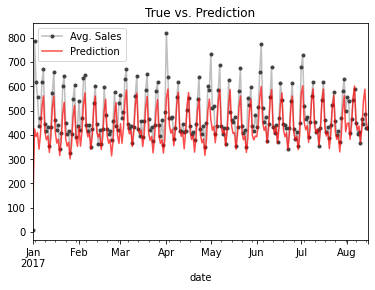

In [ ]:
ax=y.mean(axis=1).plot(**plot_params, label='Avg. Sales', title='True vs. Prediction')
ax=submit_df.mean(axis=1).plot(color='red', alpha=0.7, label='Prediction', legend=True)
ax=plt.legend()
plt.show()

In [ ]:
X_train

,weekofyear,quarter,month,dayofyear,dow_0,dow_1,dow_2,dow_3,dow_4,dow_5,dow_6,is_ny,payday,is_hol,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer
date,,,,,,,,,,,,,,,,,,,
2013-01-01,1,1,1,1,0,1,0,0,0,0,0,1,True,1.0,0.0,0.0,0.0,1.0,0.0
2013-01-02,1,1,1,2,0,0,1,0,0,0,0,0,False,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-03,1,1,1,3,0,0,0,1,0,0,0,0,False,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-04,1,1,1,4,0,0,0,0,1,0,0,0,False,0.0,0.0,0.0,0.0,0.0,0.0
2013-01-05,1,1,1,5,0,0,0,0,0,1,0,0,False,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,32,3,8,223,0,0,0,0,1,0,0,0,False,1.0,0.0,0.0,0.0,0.0,1.0
2017-08-12,32,3,8,224,0,0,0,0,0,1,0,0,False,1.0,0.0,0.0,0.0,0.0,0.0
2017-08-13,32,3,8,225,0,0,0,0,0,0,1,0,False,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
x_pred = pd.DataFrame(lr.predict(X_train))
x_pred

,0,1,2,3,4,5,6,7,8,9,...,1772,1773,1774,1775,1776,1777,1778,1779,1780,1781
0,0.297089,0.0,0.353735,109.909059,-0.014577,-3.787016,-0.154797,19.250377,-2.207593,-2.086058,...,-1.208265,-12.220305,16.171673,0.013389,-0.095977,-0.182667,7.043733,324.720047,0.671524,-1.055378
1,3.759449,0.0,2.536730,1756.007664,0.123976,424.253647,6.491600,900.442746,784.228052,142.274844,...,0.762995,352.485155,436.582574,2.634079,4.067832,411.336029,81.126625,596.312655,2.649698,16.298070
2,3.281706,0.0,2.474438,1481.337299,0.061706,366.748380,6.971368,738.447194,614.757268,120.113554,...,0.787194,490.178103,418.819191,2.357716,4.331312,465.639108,83.737146,574.880036,1.645189,19.465427
3,4.087776,0.0,2.336620,1662.252328,0.110512,380.688051,9.465132,794.372889,686.551479,156.351914,...,0.886814,303.810016,362.846874,2.068047,3.259868,420.620172,74.990611,481.119721,0.258397,14.673815
4,3.804258,0.0,2.540425,1693.080778,0.068298,352.993856,4.322708,637.451184,688.419068,132.111016,...,1.717215,430.667146,620.284565,3.812518,7.317690,620.171284,117.641199,885.086443,3.828867,23.800115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1679,1.385110,0.0,1.185687,1074.582320,0.006131,182.022962,4.624174,342.739517,366.358951,68.727233,...,3.004317,375.597346,518.024221,6.971315,11.977570,551.661945,115.738418,1499.660827,28.948867,20.450329
1680,3.690110,0.0,2.782021,1867.051302,0.119418,353.243674,9.904758,608.229153,695.957097,131.401162,...,2.125039,414.358214,589.448877,4.490488,9.442513,611.340095,113.782577,1131.898601,9.945342,21.132677
1681,1.375384,0.0,1.324706,835.212827,0.071120,149.280127,4.040212,253.182828,314.724509,57.514020,...,2.360434,460.561453,652.400147,5.124065,10.601469,702.034779,121.842967,1408.070957,12.446477,25.902464
1682,3.178425,0.0,2.903606,1771.939309,0.160662,387.845118,14.148586,710.192934,681.799696,142.374804,...,1.349395,400.463682,495.801609,3.278837,7.059825,493.152942,84.443761,973.338764,7.561685,15.194229


In [ ]:
x_pred_df = pd.DataFrame(x_pred)
x_pred_df.columns = y_.columns
x_pred_df.index = X_train.index
# x_pred_df = x_pred_df.stack(['store_nbr','family']).reset_index()
x_pred_df

sales                                                          \
store_nbr           1                                                           
family     AUTOMOTIVE BABY CARE    BEAUTY    BEVERAGES     BOOKS BREAD/BAKERY   
date                                                                            
2013-01-01   0.297089       0.0  0.353735   109.909059 -0.014577    -3.787016   
2013-01-02   3.759449       0.0  2.536730  1756.007664  0.123976   424.253647   
2013-01-03   3.281706       0.0  2.474438  1481.337299  0.061706   366.748380   
2013-01-04   4.087776       0.0  2.336620  1662.252328  0.110512   380.688051   
2013-01-05   3.804258       0.0  2.540425  1693.080778  0.068298   352.993856   
...               ...       ...       ...          ...       ...          ...   
2017-08-11   1.385110       0.0  1.185687  1074.582320  0.006131   182.022962   
2017-08-12   3.690110       0.0  2.782021  1867.051302  0.119418   353.243674   
2017-08-13   1.375384       0.0  1.324706   835.212827  0.071120   149.280127   
2017-08-14   3.178425       0.0  2.903606  1771.939309  0.160662   387.845118   
2017-08-15   3.743220       0.0  2.807728  1719.358428  0.169903   359.439412   

                                                            ...            \
store_nbr                                                   ...         9   
family     CELEBRATION    CLEANING       DAIRY        DELI  ... MAGAZINES   
date                                                        ...             
2013-01-01   -0.154797   19.250377   -2.207593   -2.086058  ... -1.208265   
2013-01-02    6.491600  900.442746  784.228052  142.274844  ...  0.762995   
2013-01-03    6.971368  738.447194  614.757268  120.113554  ...  0.787194   
2013-01-04    9.465132  794.372889  686.551479  156.351914  ...  0.886814   
2013-01-05    4.322708  637.451184  688.419068  132.111016  ...  1.717215   
...                ...         ...         ...         ...  ...       ...   
2017-08-11    4.624174  342.739517  366.358951   68.727233  ...  3.004317   
2017-08-12    9.904758  608.229153  695.957097  131.401162  ...  2.125039   
2017-08-13    4.040212  253.182828  314.724509   57.514020  ...  2.360434   
2017-08-14   14.148586  710.192934  681.799696  142.374804  ...  1.349395   
2017-08-15   10.124334  718.871421  658.650921  131.848736  ...  1.464953   

                                                                           \
store_nbr                                                                   
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2013-01-01  -12.220305     16.171673     0.013389               -0.095977   
2013-01-02  352.485155    436.582574     2.634079                4.067832   
2013-01-03  490.178103    418.819191     2.357716                4.331312   
2013-01-04  303.810016    362.846874     2.068047                3.259868   
2013-01-05  430.667146    620.284565     3.812518                7.317690   
...                ...           ...          ...                     ...   
2017-08-11  375.597346    518.024221     6.971315               11.977570   
2017-08-12  414.358214    589.448877     4.490488                9.442513   
2017-08-13  460.561453    652.400147     5.124065               10.601469   
2017-08-14  400.463682    495.801609     3.278837                7.059825   
2017-08-15  377.201889    467.310188     3.183910                6.721879   

                                                                               \
store_nbr                                                                       
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2013-01-01   -0.182667       7.043733   324.720047                   0.671524   
2013-01-02  411.336029      81.126625   596.312655                   2.649698   
20

In [ ]:
plot_params = dict(color="0.75", style=".-", markeredgecolor="0.25", markerfacecolor="0.25", legend=False)

In [ ]:
family_sales = store_sales.drop('onpromotion', axis=1).unstack(['store_nbr','family'])
family_sales.index = family_sales.index.to_period('D')
y = family_sales.loc(axis=1)['sales']
y

store_nbr           1                                                \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01        0.0       0.0    0.0       0.0   0.0     0.000000   
2013-01-02        2.0       0.0    2.0    1091.0   0.0   470.652008   
2013-01-03        3.0       0.0    0.0     919.0   0.0   310.654999   
2013-01-04        3.0       0.0    3.0     953.0   0.0   198.365997   
2013-01-05        5.0       0.0    3.0    1160.0   0.0   301.057007   
...               ...       ...    ...       ...   ...          ...   
2017-08-11        1.0       0.0    1.0    1006.0   0.0   145.606995   
2017-08-12        6.0       0.0    3.0    1659.0   0.0   243.220001   
2017-08-13        1.0       0.0    1.0     803.0   0.0   136.679001   
2017-08-14        1.0       0.0    6.0    2201.0   0.0   346.037994   
2017-08-15        4.0       0.0    4.0    1942.0   0.0   329.541016   

store_nbr                                           ...         9              \
family     CELEBRATION CLEANING  DAIRY        DELI  ... MAGAZINES       MEATS   
date                                                ...                         
2013-01-01         0.0      0.0    0.0    0.000000  ...       0.0    0.000000   
2013-01-02         0.0   1060.0  579.0  164.069000  ...       0.0  374.531006   
2013-01-03         0.0    836.0  453.0  151.582001  ...       0.0  400.863007   
2013-01-04         0.0    827.0  460.0  131.410995  ...       0.0  310.877991   
2013-01-05         0.0    811.0  464.0  118.612999  ...       0.0  447.684998   
...                ...      ...    ...         ...  ...       ...         ...   
2017-08-11         4.0    341.0  343.0   64.302002  ...       5.0  309.244995   
2017-08-12         3.0    351.0  526.0   99.487999  ...       2.0  260.298004   
2017-08-13         1.0    169.0  266.0   47.770000  ...       3.0  327.205994   
2017-08-14         4.0    571.0  699.0  154.578003  ...      12.0  330.975006   
2017-08-15        21.0    703.0  602.0  116.402000  ...      11.0  449.227997   

store_nbr                                                                  \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS     POULTRY   
date                                                                        
2013-01-01           0.0          0.0                     0.0    0.000000   
2013-01-02         482.0          0.0                     0.0  651.291992   
2013-01-03         372.0          0.0                     0.0  509.496002   
2013-01-04         324.0          0.0                     0.0  332.671997   
2013-01-05         461.0          0.0                     0.0  510.919006   
...                  ...          ...                     ...         ...   
2017-08-11         373.0         11.0                     2.0  525.223999   
2017-08-12         400.0          7.0                    10.0  383.386993   
2017-08-13         510.0          2.0                     9.0  412.458008   
2017-08-14         445.0          2.0                    14.0  283.428986   
2017-08-15         522.0          6.0                     6.0  438.132996   

store_nbr                                                                     
family     PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES    SEAFOOD  
date                                                                          
2013-01-01       0.000000     0.000000                        0.0   0.000000  
2013-01-02      83.000000     0.000000                        0.0  29.214001  
2013-01-03      66.000000     0.000000                        0.0  25.000000  
2013-01-04      57.000000     0.000000                        0.0  11.000000  
2013-01-05      84.000000     0.000000                        0.0  28.361000  
...                   ...          ...                        ...        ...  
2017-08-11     112.099998  1453.078003                      140.0  23.830999  
2

In [ ]:
y.mean(axis=1)

date
2013-01-01      1.409438
2013-01-02    278.390778
2013-01-03    202.840225
2013-01-04    198.911148
2013-01-05    267.873322
                 ...    
2017-08-11    463.733765
2017-08-12    444.798126
2017-08-13    485.768829
2017-08-14    427.004883
2017-08-15    427.980804
Freq: D, Length: 1684, dtype: float32

In [ ]:
x_pred_df.mean(axis=1)

date
2013-01-01      1.596735
2013-01-02    320.708561
2013-01-03    269.818038
2013-01-04    304.100725
2013-01-05    416.740401
                 ...    
2017-08-11    484.611523
2017-08-12    442.712906
2017-08-13    475.510375
2017-08-14    362.068812
2017-08-15    337.387443
Length: 1684, dtype: float64

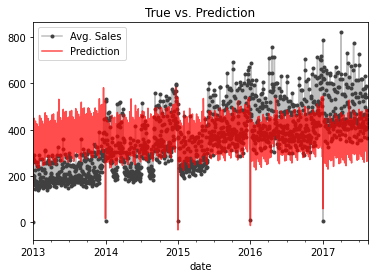

In [ ]:
ax=y.mean(axis=1).plot(**plot_params, label='Avg. Sales', title='True vs. Prediction')
ax=x_pred_df.mean(axis=1).plot(color='red', alpha=0.7, label='Prediction', legend=True)
ax=plt.legend()
plt.show()

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 9.7 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error, mean_squared_error
from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier